In [1]:
import pywavefront
# from pywavefront import visualization
# import pyglet
# # import ratcave as rc
import matplotlib.pyplot as plt
import matplotlib._color_data as mcd
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import numpy as np
import scipy as sp
import pandas as pd

from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix
from scipy.sparse import csc_matrix
from scipy.sparse import linalg
from scipy import spatial

import networkx as nx
import openmesh as om
import copy

# from open3d.cpu.pybind.geometry import HalfEdge

from collections import deque
import heapq


from rectpack import float2dec, newPacker,PackingBin
import rectangle_packing_solver as rps


%matplotlib notebook

In [2]:
scene_saddle = pywavefront.Wavefront('meshes/saddle2.obj',collect_faces=True)
# mesh_saddle=om.TriMesh()
# scene = pywavefront.Wavefront('meshes/12140_Skull_v3_L2.obj',collect_faces=True)
# G_saddle = nx.Graph()

In [3]:
class Point():
    def __init__(self,index=None,coordinates=[None,None,None]):
        self.index=index
        self.x=coordinates[0]
        self.y=coordinates[1]
        self.z=coordinates[2]
        self.u=None
        self.v=None
        self.chart=None
        self.neighbors=[]
        self.nus=[]
        self.nvs=[]
        
    def copy(self,other):
        self.index=other.index
        self.x=other.x
        self.y=other.y
        self.z=other.z
        self.u=other.u
        self.v=other.v
        self.chart=other.chart
        self.neighbors=other.neighbors

        
    def __str__(self):
        s="Point at "+"["+str(self.x)+","+str(self.y)+","+str(self.z)+"]"
        return s

In [4]:
def make_cloud(scene):
    vertices=scene.vertices
    pointcloud=[Point(i,vertices[i]) for i in range(len(vertices))]    
    face=scene.mesh_list[0].faces 
    return vertices,pointcloud,face

In [5]:
vertices_saddle,pointcloud_saddle,face_saddle=make_cloud(scene_saddle)

In [6]:
def normalise(vec):
    return vec/np.linalg.norm(vec)

In [7]:
class Face():
    def __init__(self,pointcloud,pointcloud_full,list_points):
        self.index=[list_points[0],list_points[1],list_points[2]]
        
        self.v1=pointcloud_full[list_points[0]]
        self.v2=pointcloud_full[list_points[1]]
        self.v3=pointcloud_full[list_points[2]]
    def local_coordinates(self):
        self.coords=[] #[x1,y1],[x2,y2],[x3,y3] -> [0,0],[x2,0],[x3,y3]
        
        vec_1=np.array([self.v1.x,self.v1.y,self.v1.z])
        vec_2=np.array([self.v2.x,self.v2.y,self.v2.z])
        vec_3=np.array([self.v3.x,self.v3.y,self.v3.z])     
        
        bary=np.mean([vec_1,vec_2,vec_3],axis=0)     
        
        vec_21=vec_2-vec_1
        vec_x=normalise(vec_21)
        
        
        vec_31=vec_3-vec_1
        vec_n=np.cross(vec_x,vec_31)
        vec_n=normalise(vec_n)
        vec_y=np.cross(vec_n,vec_x)
        vec_y=normalise(vec_y)
        
        
        vec_bary=bary-vec_1
        
        x2=vec_21@vec_x
        # self.coords.append([x2,0])

        x3=vec_31@vec_x
        y3=vec_31@vec_y
        # self.coords.append([x3,y3])
        pos_bary=[vec_bary@vec_x,vec_bary@vec_y]   
        
        self.x1=0
        self.y1=0
        self.x2=x2
        self.y2=0
        self.x3=x3
        self.y3=y3
        
        self.coords=[[self.x1,self.y1],[self.x2,self.y2],[self.x3,self.y3]]
    def calculate_area(self):
        self.area=abs(self.x1*self.y2-self.y1*self.x2+self.x2*self.y3-self.y2*self.x3+self.x3*self.y1-self.y3*self.x1)
        
    def calculate_W(self):
        self.W1=complex(self.x3-self.x2,self.y3-self.y2)
        self.W2=complex(self.x1-self.x3,self.y1-self.y3)
        self.W3=complex(self.x2-self.x1,self.y2-self.y1)
        self.W=[self.W1,self.W2,self.W3]

In [8]:
def distance(pa,pb):
    return np.sqrt((pa.x-pb.x)**2+(pa.y-pb.y)**2+(pa.z-pb.z)**2)

In [9]:
def longest_distance(pointcloud):
    pts=[]
    for point in pointcloud:
        pts.append([point.x,point.y,point.z])
    # print(pts[0])
    # print(spatial.ConvexHull(pts).vertices[0])
    candidates = [pts[i] for i in spatial.ConvexHull(pts, qhull_options="QJ").vertices]
    dist_mat = spatial.distance_matrix(candidates, candidates)
    i, j = np.unravel_index(dist_mat.argmax(), dist_mat.shape)
    return [i,j]

In [10]:
def make_links(pointcloud,pointcloud_full,faces):
    facecloud=[]
    for face in faces:
        f=Face(pointcloud,pointcloud_full,face)
        f.local_coordinates()
        f.calculate_area()
        f.calculate_W()
        facecloud.append(f)
        for v1 in face:
            for v2 in face:
                point1=pointcloud_full[v1]
                point2=pointcloud_full[v2]
                if not point2 in point1.neighbors and v2 !=v1:
                    point1.neighbors.append(point2)
    return facecloud

In [11]:
facecloud_saddle=make_links(pointcloud_saddle,pointcloud_saddle,face_saddle)
num_face=len(pointcloud_saddle)
num_face # n'

741

In [12]:
for f in facecloud_saddle:
    if f.area==0:
        print(f.coords)

In [13]:
def make_pins(pointcloud,pointlist,values):
# Up is the vector of pinned coordinates
    for i in range(len(pointlist)):       
        pointcloud[pointlist[i]].u=values[2*i]
        pointcloud[pointlist[i]].v=values[2*i+1]
        # print(pointcloud[pointlist[i]].u)


In [14]:
def set_pins(pc):
    pin_vertex=longest_distance(pc)
    coords=[]
    
    for point_id in pin_vertex:
        point=pc[point_id]
        # print(point)
        coords.append(point.x)
        coords.append(point.y)
        coords.append(point.z)
    extreme=min(coords)
    pin_vertex=[0,1]
    make_pins(pc,pin_vertex,[-extreme,-extreme,extreme,extreme])
    return pin_vertex,extreme

In [15]:
pin_vertex,diameter=set_pins(pointcloud_saddle)

In [16]:
def draw3d(pc,point_size,line_width,color_v='b',color_e='r'):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for point in pc: 
        ax.scatter3D(point.x, point.y, point.z,s=point_size,c=color_v) 
        if point.index<4:
            ax.text(point.x, point.y, point.z,point.index) 
        for p2 in point.neighbors:
            ax.plot([point.x,p2.x],[point.y,p2.y],[point.z,p2.z],c=color_e,linewidth=line_width)
    # ax.plot([pointcloud[0].x,pointcloud[3].x],[pointcloud[0].y,pointcloud[3].y],[pointcloud[0].z,pointcloud[3].z],c='g')
    ax.set_title('3d Scatter plot')
    plt.show()

<IPython.core.display.Javascript object>


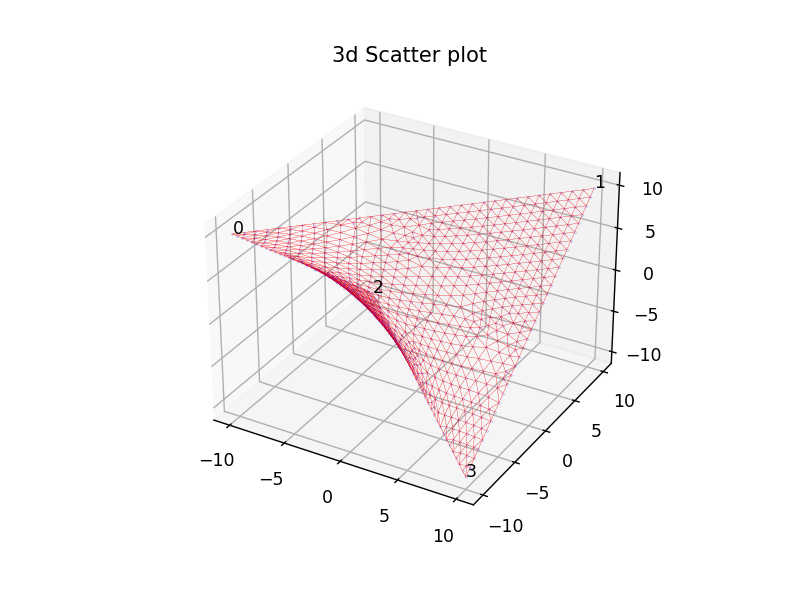

In [494]:
draw3d(pointcloud_saddle,0.01,0.1)

In [17]:
def pin_matrix(pointcloud,pointlist):
    cp=[]
    # print(pointlist)
    for point in pointlist:
#         print(point)
#         print(pointcloud[point].u)
#         print(pointcloud[point].v)
        cp.append(complex(pointcloud[point].u,pointcloud[point].v))
    U_p=np.array(cp).reshape((-1,1))
    return U_p
# U_p=np.array([complex(pointcloud[0].u,pointcloud[0].v),complex(pointcloud[1].u,pointcloud[1].v),complex(pointcloud[2].u,pointcloud[2].v),complex(pointcloud[3].u,pointcloud[3].v)]).reshape((-1,1))

In [18]:
U_p=pin_matrix(pointcloud_saddle,pin_vertex)

In [19]:
def LSCM(vertices,faces):
    n_f=len(faces)
    n_v=len(vertices)

    M_p=np.zeros((n_f,n_v),dtype=complex)
    for i in range(n_f):
        face_temp=faces[i]
        for j in range(3):
            M_p[i,face_temp.index[j]]=face_temp.W[j]/np.sqrt(face_temp.area)            
    return M_p

In [20]:
M=LSCM(pointcloud_saddle,facecloud_saddle)

In [21]:
def split_mat(M,pointlist):
    # print(pointlist)
#     print("M")
#     print(M)
    M_p=M[:,pointlist]
#     print("Mp")
#     print(M_p)
    M_f=np.delete(M,pointlist,axis=1)
#     print("Mf")
#     print(M_f)
    
    return M_p,M_f

In [22]:
M_p,M_f=split_mat(M,pin_vertex)

In [23]:
def build_mat(M_f,M_p,U_p):
    M_f1=M_f.real
    M_f2=M_f.imag
    M_p1=M_p.real
    M_p2=M_p.imag
    U_p1=U_p.real    
    U_p2=U_p.imag
    
    A_1=np.hstack([M_f1,-1*M_f2])
    A_2=np.hstack([M_f2,M_f1])
    A=np.vstack([A_1,A_2])
    
    b_1=np.hstack([M_p1,-1*M_p2])
    b_2=np.hstack([M_p2,M_p1])
    b=-1*np.vstack([b_1,b_2])
    
    Up=np.vstack([U_p1,U_p2])  

    b=b@Up
    return A,b

In [24]:
A,b=build_mat(M_f,M_p,U_p)

In [25]:
def solve(A,b):
#     A=csr_matrix(A)
#     b=csr_matrix(b)
    # res=sp.sparse.linalg.inv(A.T@A)@A.T@b
    # res=np.linalg.inv(A.T@A)@A.T@b
    res=np.linalg.pinv(A.T@A)@A.T@b
    return res

In [26]:
uv=solve(A,b)
uv.T[0]

array([ 27.22521496,   9.9750196 ,   9.36639489, ...,   7.55658764,
       -18.89699519,   1.45979231])

In [27]:
def update_uv(pc,uv):
    for point in pc:
        if point.u!=None:
            continue
        point.u=uv.T[0][point.index-2]
        point.v=uv.T[0][point.index-2+int(len(uv)/2)]



In [28]:
update_uv(pointcloud_saddle,uv)

In [29]:
def draw(pointcloud,pointsize=1,draw_lines=True,text=False):
    fig = plt.figure()
    ax = plt.axes()
    for point in pointcloud:
        ax.scatter(point.u,point.v,s=pointsize,c='b')
        if draw_lines:
            for nei in point.neighbors:
                ax.plot([point.u,nei.u],[point.v,nei.v],c='r')
        if text:
            ax.text(point.u,point.v,point.index)
    ax.axis("equal") 
    plt.show()
    


<IPython.core.display.Javascript object>


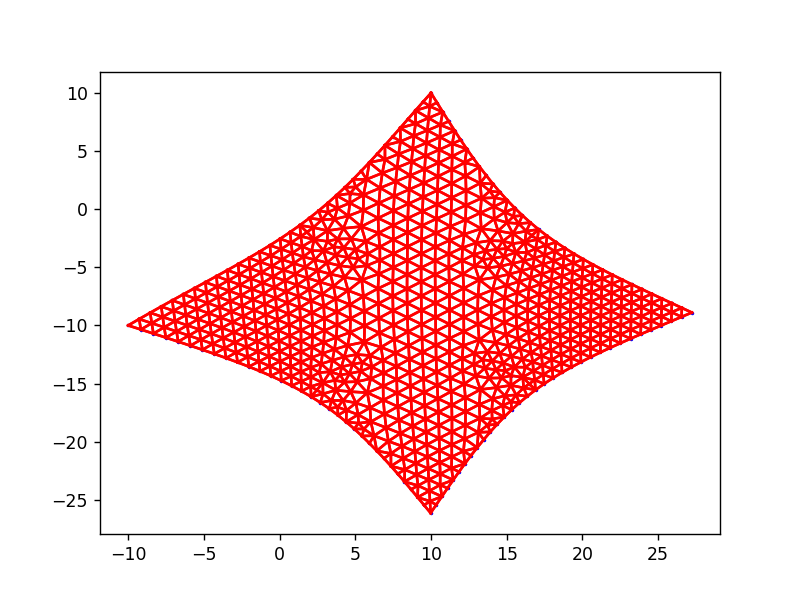

In [153]:
draw(pointcloud_saddle)

In [30]:
def projection(pointcloud,pointcloud_full,face):
    facecloud=make_links(pointcloud,pointcloud_full,face)
#     for f in facecloud:
#         print(f.coords)
    pin_vertex,diameter=set_pins(pointcloud)
#     print("pin "+str(pin_vertex))
#     print("D "+str(diameter))
#     for p in pointcloud:
#         print("u: "+str(p.u)+" v: "+str(p.v))
    U_p=pin_matrix(pointcloud,pin_vertex)
#     print(U_p)
    M=LSCM(pointcloud,facecloud)
    M_p,M_f=split_mat(M,pin_vertex)
    A,b=build_mat(M_f,M_p,U_p)
    uv=solve(A,b)
    update_uv(pointcloud,uv)

In [31]:
scene_saddle_0 = pywavefront.Wavefront('meshes/saddle2.obj',collect_faces=True)
vertices_saddle_0,pointcloud_saddle_0,face_saddle_0=make_cloud(scene_saddle_0)

projection(pointcloud_saddle_0,pointcloud_saddle_0,face_saddle_0)

<IPython.core.display.Javascript object>


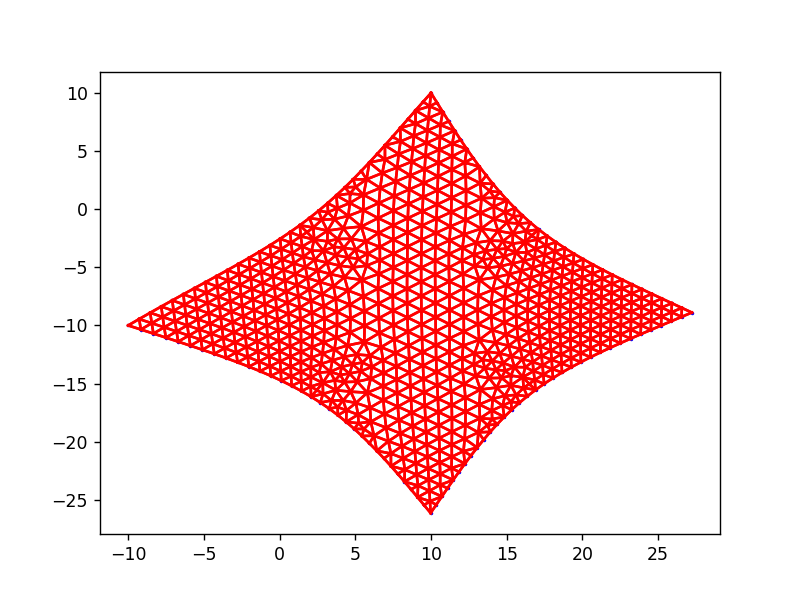

In [32]:
draw(pointcloud_saddle_0)

In [32]:
scene_circle = pywavefront.Wavefront('meshes/circle.obj',collect_faces=True)
vertices_circle,pointcloud_circle,face_circle=make_cloud(scene_circle)


Unimplemented OBJ format statement 's' on line 's off'


In [33]:
projection(pointcloud_circle,pointcloud_circle,face_circle)

<IPython.core.display.Javascript object>


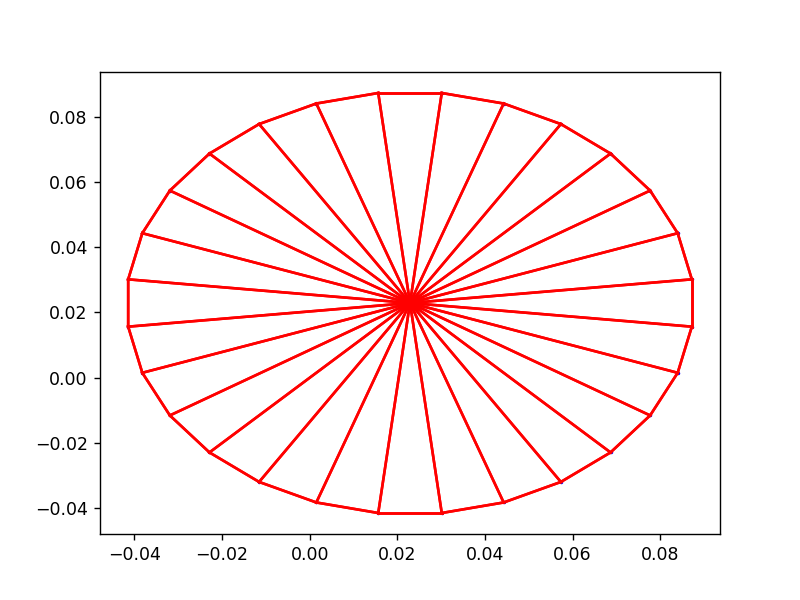

In [35]:
draw(pointcloud_circle)

<IPython.core.display.Javascript object>


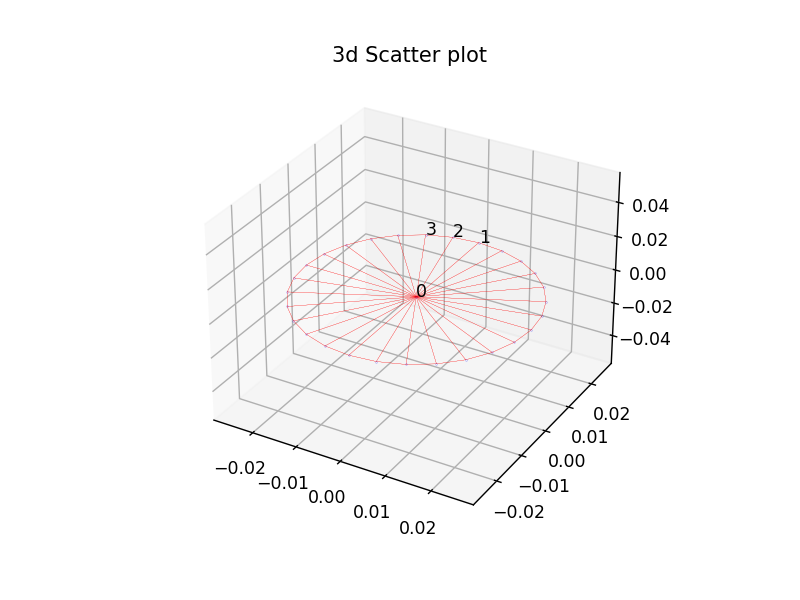

In [141]:
draw3d(pointcloud_circle,0.01,0.1)

In [36]:
scene_rabbit = pywavefront.Wavefront('meshes/rabbit.obj',collect_faces=True,create_materials=True)
mesh_rabbit = om.read_trimesh("meshes/rabbit.obj",vertex_normal=True,halfedge_status=True)
G_rabbit = nx.Graph()

In [37]:
vertices_rabbit,pointcloud_rabbit,face_rabbit=make_cloud(scene_rabbit)
facecloud_rabbit=make_links(pointcloud_rabbit,pointcloud_rabbit,face_rabbit)

In [38]:
def convexhull(pointcloud):
    pts=[]
    for point in pointcloud:
        pts.append([point.x,point.y,point.z])
    # print(pts[0])
    # print(spatial.ConvexHull(pts).vertices[0])
    candidates = [pointcloud[i] for i in spatial.ConvexHull(pts).vertices]
    return candidates

In [39]:
print("total vertices: "+str(mesh_rabbit.n_vertices()))
print("total edges: "+str(mesh_rabbit.n_halfedges()))
print("total faces: "+str(mesh_rabbit.n_faces()))

total vertices: 34817
total edges: 208890
total faces: 69630


<IPython.core.display.Javascript object>


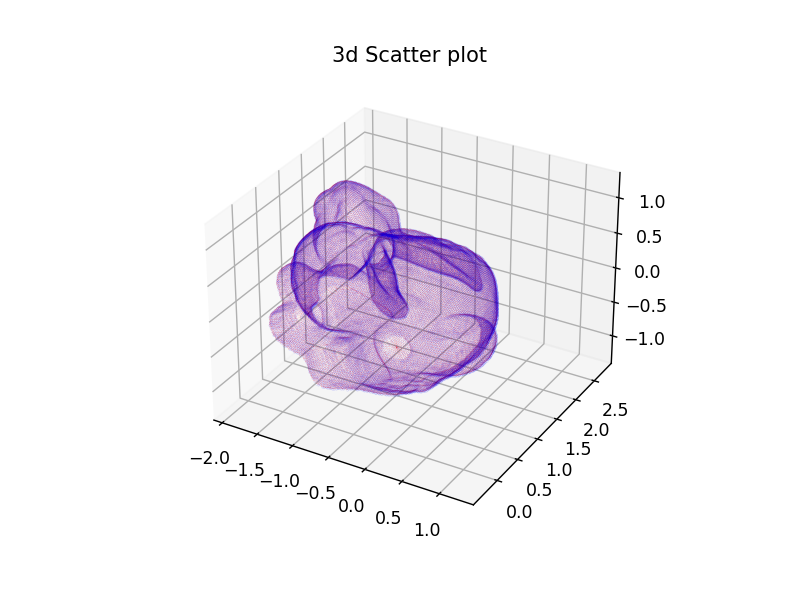

In [36]:
draw3d(pointcloud_rabbit,0.001,0.01)

In [40]:
def calculate_normal(mesh):
    for h in mesh.halfedges():
        mesh.calc_halfedge_normal(h)
    for f in mesh.faces():
        mesh.calc_face_normal(f)

In [41]:
calculate_normal(mesh_rabbit)

In [42]:
def calculate_sharpeness(mesh,edge):
    edge_o=mesh.opposite_halfedge_handle(edge)
    face=mesh.face_handle(edge)
    face_o=mesh.face_handle(edge_o)
    if (face.idx()==-1 or face_o.idx()==-1):
        print("boundary")
        return np.pi
    normal=mesh.normal(face)
    normal_o=mesh.normal(face_o)
    normal=normalise(normal)
    normal_o=normalise(normal_o)
    return np.arccos(normal@normal_o)

In [43]:
def calculate_sharpeness_list(mesh,edges):
    if len(edges)==0:
        return 0.0
    s=0
    for edge in edges:
        s+=calculate_sharpeness(mesh,edge)
    return s

In [44]:
def filter_edges(mesh,threshold):
    # remain=[]
    all_edges=[]
    for h in mesh.halfedges():
        all_edges.append([h,calculate_sharpeness(mesh,h)])
    all_edges.sort(key=lambda x:x[1],reverse=True)
    remain=[item[0] for item in all_edges[:int(len(all_edges)*threshold)]]
    return remain

In [45]:
Tau=0.01

In [46]:
detected_edges_rabbit=filter_edges(mesh_rabbit,Tau)

In [47]:
def string_copy(s):
    cs=deque()
    for i in range(len(s)):
        cs.append(s[i])
    return cs

In [48]:
def dfs(mesh, edge_current, S, sharpness_current, max_string_length,tau,feature,feature_neighbor,all_edges):
#     l=length_current
#     assert len(S)==l
#     if length_current == max_string_length:
#         return sharpness_current,copy(S)

    if len(S) == max_string_length:
        return sharpness_current,string_copy(S)
    edge_oppo=mesh.opposite_halfedge_handle(edge_current)
    S_iter=deque()
    sharpness_iter=sharpness_current
    vertex_temp=mesh.to_vertex_handle(edge_current)
    edge_neighbors=mesh.voh(vertex_temp)
#             for item in mesh.voh(vertex_temp):
#                 l_temp.append(item)
    for nei in edge_neighbors:
#         if (nei==edge_oppo) or (nei in feature_neighbor):
#             continue
        if (nei==edge_oppo) or (all_edges[nei.idx()]==1):
            continue
        S.append(nei)
#         l+=1
#         sharpness_nei=calculate_sharpeness(mesh,nei)
#         sharpness_prime,S_prime=dfs(mesh, nei, S, sharpness_current+sharpness_nei, l,\
#                                     max_string_length,tau,feature,feature_neighbor)  
#         S.pop()
#         l-=1
        sharpness_nei=calculate_sharpeness(mesh,nei)
        sharpness_prime,S_prime=dfs(mesh, nei, S, sharpness_current+sharpness_nei,\
                                    max_string_length,tau,feature,feature_neighbor,all_edges)  
        S.pop()
        if (sharpness_prime>sharpness_iter):
            sharpness_iter=sharpness_prime
            S_iter=string_copy(S_prime)
    return sharpness_iter,S_iter

In [49]:
def add_neighbor_feature(mesh,edge,feature,feature_neighbor,all_edges):
    vt=mesh.to_vertex_handle(edge)
    edges_in=mesh.vih(vt)
    edges_out=mesh.voh(vt)
    for edge in edges_in:
#         if (not edge in feature) and (not edge in feature_neighbor):
#             feature_neighbor.append(edge)
        if all_edges[edge.idx()]==-1:
            feature_neighbor.append(edge)
            all_edges[edge.idx()]=1
    for edge in edges_out:
#         if (not edge in feature) and (not edge in feature_neighbor):
#             feature_neighbor.append(edge)
        if all_edges[edge.idx()]==-1:
            feature_neighbor.append(edge)
            all_edges[edge.idx()]=1
    

In [50]:
def expand_feature_curve(mesh,start,min_feature_length,max_string_length,tau,feature,feature_neighbor):
    detected_feature=[]
    all_edges=[-1 for i in range(mesh.n_halfedges())]
    for h in [start,mesh.opposite_halfedge_handle(start)]:
        h_prime=h
        sharpness=0
        while True:
            S=deque()
            S.append(h_prime)
            sharpness_current=calculate_sharpeness(mesh,h_prime)
            sharpness,S=dfs(mesh, h_prime, S, sharpness_current,\
                             max_string_length,tau,feature,feature_neighbor,all_edges)
            if len(S)<2:
                
                break
            
            h_prime=S[1]
#             if h_prime in detected_feature:
#                 break
            if all_edges[h_prime.idx()]==0:
                break
            detected_feature.append(h_prime)
            all_edges[h_prime.idx()]=0
            
            if sharpness <= max_string_length * tau:
                break
    
    # print(len(detected_feature))           
    if len(detected_feature) > min_feature_length:
        # print("add to feature")
        for item in detected_feature:
            feature.append(item)
            
        h_o=mesh.opposite_halfedge_handle(detected_feature[0])
        add_neighbor_feature(mesh,h_o,feature,feature_neighbor,all_edges)
        for edge_feature in detected_feature:
            add_neighbor_feature(mesh,edge_feature,feature,feature_neighbor,all_edges)

In [51]:
def detect_features(mesh,edges,t):
    max_string_length=5
    min_feature_length=15
    feature=[]
    feature_neighbor=[]
    tau=t
    i=0
    for start in edges:
        if i%100==0:
            print("finished "+str(i)+"/"+str(len(edges)))
        expand_feature_curve(mesh,start,min_feature_length,max_string_length,tau,feature,feature_neighbor)
        i+=1
    return feature,feature_neighbor

In [57]:
feature_rabbit,feature_neighbor_rabbit=detect_features(mesh_rabbit,detected_edges_rabbit,Tau)

finished 0/10444
finished 100/10444
finished 200/10444
finished 300/10444
finished 400/10444
finished 500/10444
finished 600/10444
finished 700/10444
finished 800/10444
finished 900/10444
finished 1000/10444
finished 1100/10444
finished 1200/10444
finished 1300/10444
finished 1400/10444
finished 1500/10444
finished 1600/10444
finished 1700/10444
finished 1800/10444
finished 1900/10444
finished 2000/10444
finished 2100/10444
finished 2200/10444
finished 2300/10444
finished 2400/10444
finished 2500/10444
finished 2600/10444
finished 2700/10444
finished 2800/10444
finished 2900/10444
finished 3000/10444
finished 3100/10444
finished 3200/10444
finished 3300/10444
finished 3400/10444
finished 3500/10444
finished 3600/10444
finished 3700/10444
finished 3800/10444
finished 3900/10444
finished 4000/10444
finished 4100/10444
finished 4200/10444
finished 4300/10444
finished 4400/10444
finished 4500/10444
finished 4600/10444
finished 4700/10444
finished 4800/10444
finished 4900/10444
finished 500

In [50]:
def save_features(feature,neighbor,file_feature_path,file_neighbor_path):
    l=[]
    ln=[]
    for f in feature:
        l.append(f.idx())
    for n in neighbor:
        ln.append(n.idx())
    l=np.array(l)
    ln=np.array(ln)
    np.save(file_feature_path,l)
    np.save(file_neighbor_path,ln)

In [52]:
features_rabbit="features_rabbit_small.npy"
neighbors_rabbit="neighbors_rabbit_small.npy"


In [84]:
save_features(feature_rabbit,feature_neighbor_rabbit,features_rabbit,neighbors_rabbit)

NameError: name 'save_features' is not defined

In [53]:
def read_features(mesh,file_feature_path,file_neighbor_path):
    np_f=np.load(file_feature_path)
    np_n=np.load(file_neighbor_path)
    features=[]
    neighbors=[]
    for i in np_f:
        features.append(mesh.halfedge_handle(int(i)))
    for i in np_n:
        neighbors.append(mesh.halfedge_handle(int(i)))
    return features,neighbors
    

In [54]:
feature_rabbit,feature_neighbor_rabbit=read_features(mesh_rabbit,features_rabbit,neighbors_rabbit)

In [55]:
def feature_vertex(mesh,feature_edge,point_cloud):
    points=[]
    for edge in feature_edge:
        edge_o=mesh.opposite_halfedge_handle(edge)
        v=mesh.to_vertex_handle(edge)
        v_o=mesh.to_vertex_handle(edge_o)
        points.append([point_cloud[v.idx()],point_cloud[v_o.idx()]])
    return points

In [56]:
feature_vertices_rabbit=feature_vertex(mesh_rabbit,feature_rabbit,pointcloud_rabbit)

In [57]:
def draw_features(points_features,pc,size_point,width_line):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for point in pc: 
        
        ax.scatter3D(point.x, point.y, point.z,s=size_point,c='b') 
    for p2 in points_features:
        
        ax.plot([p2[0].x,p2[1].x],[p2[0].y,p2[1].y],[p2[0].z,p2[1].z],c='r',linewidth=width_line)
    # ax.plot([pointcloud[0].x,pointcloud[3].x],[pointcloud[0].y,pointcloud[3].y],[pointcloud[0].z,pointcloud[3].z],c='g')
    ax.set_title('features')
    plt.show()

<IPython.core.display.Javascript object>


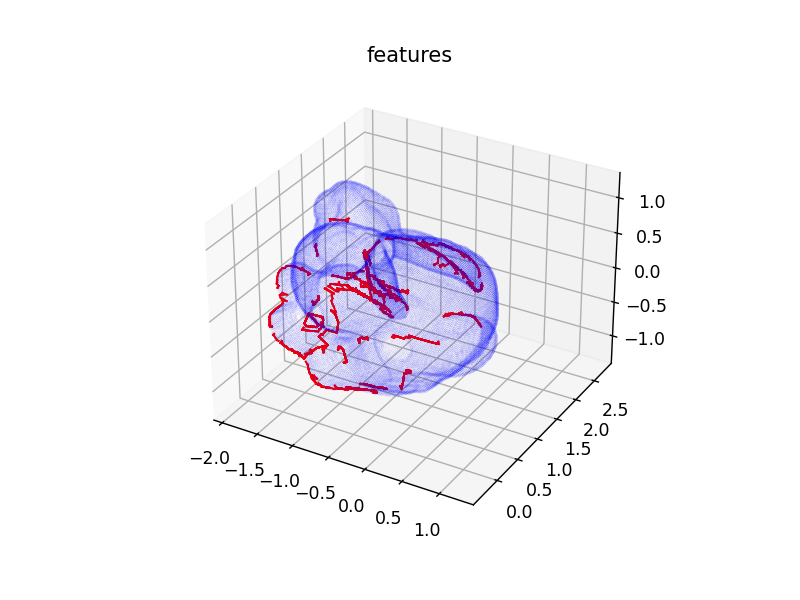

In [219]:
draw_features(feature_vertices_rabbit,pointcloud_rabbit,0.001,1)

In [58]:
class Facet():    
    def __init__(self,mesh,index,facet):
        self.mesh=mesh
        self.index=index
        self.face=facet
        self.distance_to_feature=mesh.n_halfedges()
        self.vertices=[]
        self.edges=[]
        self.is_local_maximum=False
        self.chart=-1
        
    def __lt__(self,other):
        return self.distance_to_feature<other.distance_to_feature
        
    def get_ve(self):
        e=self.mesh.halfedge_handle(self.face)
        self.edges.append(e)
        self.vertices.append(self.mesh.to_vertex_handle(e))
        ne=self.mesh.next_halfedge_handle(e)
    
        while ne!=e:
            self.edges.append(ne)
            self.vertices.append(self.mesh.to_vertex_handle(ne))
            ne=self.mesh.next_halfedge_handle(ne)
       

In [59]:
facets_rabbit=[Facet(mesh_rabbit,i,mesh_rabbit.face_handle(i)) for i in range(len(mesh_rabbit.faces()))]

In [60]:
def construct_facets(mesh,facets):
    for f in facets:
        f.get_ve()

In [61]:
construct_facets(mesh_rabbit,facets_rabbit)

In [62]:
def get_facet(mesh,faces,edge):
    #print(mesh.face_handle(edge))
    #print(mesh.face_handle(edge).idx())
    return faces[mesh.face_handle(edge).idx()]

In [63]:
def distance_to_features(mesh,facets,feature_edges):
        
    edges=deque()
    for e in feature_edges:
        f=get_facet(mesh,facets,e)
        f.distance_to_feature=0
        edges.append([e,0])
    
    max_dist=0
    visited=[0 for i in range(mesh.n_halfedges())]
    
    while len(edges)>0:
        
        edge_temp,dis_temp=edges.popleft()
        facet_temp=get_facet(mesh,facets,edge_temp)
        # print("f+ "+str(facet_temp.distance_to_feature))
        # print("d+ "+str(dis_temp))
        facet_temp.distance_to_feature=min(facet_temp.distance_to_feature,dis_temp)
        
        vt=mesh.to_vertex_handle(edge_temp)
        edges_in=mesh.vih(vt)
        edges_out=mesh.voh(vt)
        neighbors_temp=[]
        for e in edges_in:
            neighbors_temp.append(e)
        for e in edges_out:
            neighbors_temp.append(e)
        for edge in neighbors_temp:
            if visited[edge.idx()]==0:
                visited[edge.idx()]=1
                edges.append([edge,dis_temp+1])
                max_dist=dis_temp+1
#         if (mesh.n_halfedges()-sum(visited)) % 1000==0:        
#             print("edges not noted: "+str(mesh.n_halfedges()-sum(visited)))
                
    return max_dist

In [64]:
max_distance_rabbit=distance_to_features(mesh_rabbit,facets_rabbit,feature_rabbit)
max_distance_rabbit

40

In [65]:
def face_to_facet(face,facets):
    # print(face.idx())
    return facets[face.idx()]
            
def calculate_maximum(mesh,f,facets):
    neighbors=[face_to_facet(mesh.face_handle(mesh.opposite_halfedge_handle(edge)),facets) for edge in f.edges]
    distances=[i.distance_to_feature for i in neighbors]
    if f.distance_to_feature>=max(distances):
        f.is_local_maximum=True

In [66]:
def max_facets(mesh,facet):
    max_f=[]
    for f in facet:
        calculate_maximum(mesh,f,facet)
        if f.is_local_maximum:
            max_f.append(f)
    return max_f

In [67]:
local_max_rabbit=max_facets(mesh_rabbit,facets_rabbit)

In [68]:
class chart():
    pi=0
    def __init__(self):
        self.id=chart.pi
        self.facets=[]
        self.distance_to_feature=[]
        chart.pi+=1
        self.max_dist=0
        self.merged=False
 
        
    def add_facet(self,f):
        self.facets.append(f)
        self.max_dist=max(self.max_dist,f.distance_to_feature)
    
    def max_dist(self):
        pass
    
    def chart_boundaries(self):
        pass
    
    def merge(self,other):
        for f in other.facets:
            self.add_facet(f)
            f.chart=self.id
        
        other.merged=True

In [69]:
class Edge():
    def __init__(self,mesh,index,edge,facets):
        self.mesh=mesh
        self.index=index
        self.edge=edge
        # print(edge.idx())
        self.facets=facets
        
    def __lt__(self,other):
        fs=self.mesh.face_handle(self.edge)
        Fs=face_to_facet(fs,self.facets)
        fo=self.mesh.face_handle(other.edge)
        Fo=face_to_facet(fo,self.facets)
        
        return Fs.distance_to_feature>Fo.distance_to_feature           # reverse


In [70]:
Edges_rabbit=[Edge(mesh_rabbit,i,mesh_rabbit.halfedge_handle(i),facets_rabbit) for i in range(len(mesh_rabbit.halfedges()))]

In [71]:
def edge_to_Edge(edge,Edges):
    return Edges[edge.idx()]

In [72]:
def expand_charts(mesh,facets,local_max,Edges,epsilon):
    heap=[]
    chart_boundaries=string_copy(Edges)
    charts=[]
    
    # print(len(local_max))
    
    for facet in local_max:
        c=chart()
        c.add_facet(facet)
        charts.append(c)
        # print(c.id)
        facet.chart=c.id
        for edge in facet.edges:
            heapq.heappush(heap,edge_to_Edge(edge,Edges))
    
    # print(len(charts))
    
    a=len(facets)-len(local_max)
    # print(a)
            
    while len(heap)>0:
        h=heapq.heappop(heap)
        F=face_to_facet(mesh.face_handle(h.edge),facets)
        F_o=face_to_facet(mesh.face_handle(mesh.opposite_halfedge_handle(h.edge)),facets)
        # print(F.chart)
        chart_F=charts[F.chart]
        if F_o.chart==-1:
            chart_F.add_facet(F_o)
            F_o.chart=chart_F.id
            chart_boundaries.remove(h)
            
            a-=1
            
            if a % 1000==0:
            
                print("Facets left: "+str(a))
            
            for e in F_o.edges:
                # print(type(e))
                # print(type(chart_boundaries[0]))
                E_temp=edge_to_Edge(e,Edges)
                if E_temp in chart_boundaries:
                    heapq.heappush(heap,E_temp)
                    
        elif F_o.chart!=F.chart:
            chart_Fo=charts[F_o.chart]
            if chart_F.max_dist-F.distance_to_feature<epsilon and chart_Fo.max_dist-F.distance_to_feature<epsilon:
                chart_F.merge(chart_Fo)
                # charts.remove(chart_Fo)
    
    return charts

In [73]:
charts_rabbit=expand_charts(mesh_rabbit,facets_rabbit,local_max_rabbit,Edges_rabbit,max_distance_rabbit/4)

Facets left: 34000
Facets left: 33000
Facets left: 32000
Facets left: 31000
Facets left: 30000
Facets left: 29000
Facets left: 28000
Facets left: 27000
Facets left: 26000
Facets left: 25000
Facets left: 24000
Facets left: 23000
Facets left: 22000
Facets left: 21000
Facets left: 20000
Facets left: 19000
Facets left: 18000
Facets left: 17000
Facets left: 16000
Facets left: 15000
Facets left: 14000
Facets left: 13000
Facets left: 12000
Facets left: 11000
Facets left: 10000
Facets left: 9000
Facets left: 8000
Facets left: 7000
Facets left: 6000
Facets left: 5000
Facets left: 4000
Facets left: 3000
Facets left: 2000
Facets left: 1000
Facets left: 0


In [74]:
charts_valid_rabbit=[]
for c in charts_rabbit:
    if not c.merged:
        charts_valid_rabbit.append(c)
len(charts_valid_rabbit)

19

In [75]:
for i in charts_valid_rabbit:
    print(len(i.facets))

1020
304
368
244
1254
448
2026
19502
306
7776
15450
680
7046
1006
224
1984
2228
7176
588


In [76]:
def chart_points(charts,pc):
    chart_ps=[]
    for c in charts:
        chart_p=[]
        for f in c.facets:
            for v in f.vertices:
#                p_temp=pc[v.idx()]
#                 pp=Point()
#                 pp.copy(p_temp)
                chart_p.append(pc[v.idx()])
        chart_ps.append(chart_p)       
        
    return chart_ps

In [77]:
chart_pointclouds_rabbit=chart_points(charts_valid_rabbit,pointcloud_rabbit)

In [78]:
def multi_tuple(fac,tu):
    a=[fac*i for i in tu]
    return np.array(a).reshape(1,-1)

In [79]:
def draw3d_multichart(pcs,point_size,line_width,color_v='b',color_e='r'):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for pc in pcs:
        col=mcolors.XKCD_COLORS.popitem()[1]
        for point in pc: 
            
            ax.scatter3D(point.x, point.y, point.z,s=point_size,c=col)
#             if point.index<4:
#                 ax.text(point.x, point.y, point.z,point.index) 
            for p2 in point.neighbors:
                ax.plot([point.x,p2.x],[point.y,p2.y],[point.z,p2.z],c=col,linewidth=line_width)
        # color_i+=1
    # ax.plot([pointcloud[0].x,pointcloud[3].x],[pointcloud[0].y,pointcloud[3].y],[pointcloud[0].z,pointcloud[3].z],c='g')
    ax.set_title('3d Scatter plot multi chart')
    plt.show()

<IPython.core.display.Javascript object>


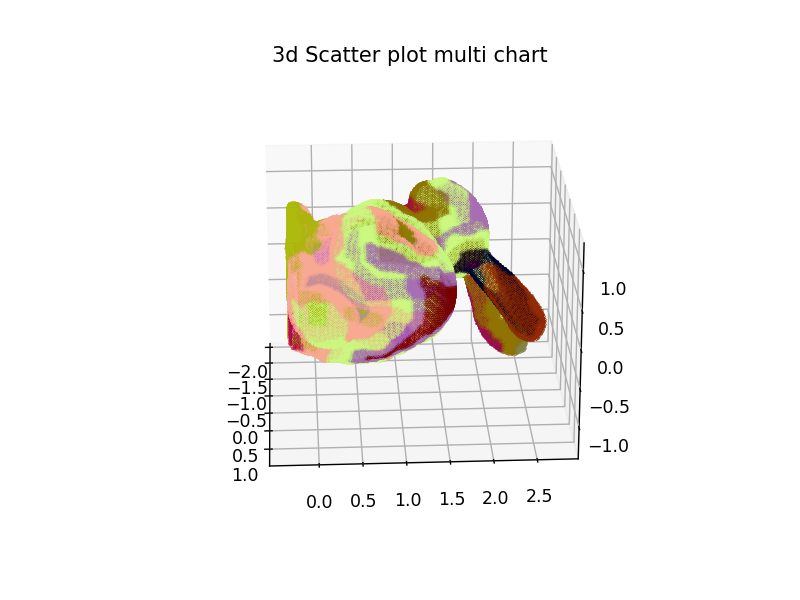

In [112]:
draw3d_multichart(chart_pointclouds_rabbit,0.005,0.05)

In [ ]:
# def remove_repeat(points_chart):
#     list_points=[]
#     indexes=[]
#     for p in points_chart:
#         list_points.append(p)
#         indexes.append(p.index)
    
#     for p in list_points:
#         removed=False
#         for v in p.neighbors:
#             if not v.index in indexes:
#                 list_points.remove(p)
#                 removed=True
#                 break
#         if not removed:        
#             if len(p.neighbors)<3:
#                 list_points.remove(p)
        
#     return list_points

In [80]:
def face_correspond(points_chart,pc,face_total):
    indexes=[]
    for p in points_chart:
        indexes.append(p.index)
    # print(indexes)
    faces_chart=[]
    for face in face_total:
        # print(face)
#         if (face[0] in indexes):
#             point_temp=pc[face[0]]
#             if (pc[face[1]] in point_temp.neighbors) and (pc[face[2]] in point_temp.neighbors) and (face[1] in indexes) and (face[2] in indexes):
#                 faces_chart.append(face)
        if (face[0] in indexes) and (face[1] in indexes) and (face[2] in indexes):
            faces_chart.append(face)
        
    return faces_chart
            
    

In [81]:
def save_uvs(pc):
    us=[]
    vs=[]
    for p in pc:
        uss=[]
        vss=[]
        for pn in p.neighbors:
            uss.append(pn.u)
            vss.append(pn.v)
        us.append(uss)
        vs.append(vss)
    return [us,vs]

In [82]:
def seperate_mesh(charts,pc,faces):
    all_charts=[]
    face_charts=[]
    no=0
    for chart in charts:
        test=[i for i in set(chart)]
        ftest=face_correspond(test,pc,faces)
        dictionary={}
        i=0
        for point in test:
            dictionary[point.index]=i
            point.index=i
    
            i+=1
        
    
        for f in ftest:
            for j in range(len(f)):
                a=f[j]
                b=dictionary[a]
                f[j]=b
        try:        
            projection(test,test,ftest)        
            all_charts.append(test)
            save_uvs(test)
            draw(test)
            face_charts.append(ftest)
        except np.linalg.LinAlgError:
            print("chart No."+str(no)+" not isometric")
        finally:
            no+=1
    return all_charts,face_charts

In [83]:
def draw_chart(pchart,point_size=0.01,line_width=0.001,color_v='b',color_e='r'):
    fig = plt.figure()
    ax = plt.axes()
    for point in pchart: 
        ax.scatter(point.u, point.v,s=point_size,c=color_v) 
        for i in range(len(p.nus)):
            ax.plot([point.u,p.nus[i]],[point.v,p.nvs[i]],c=color_e,linewidth=line_width)
    # ax.plot([pointcloud[0].x,pointcloud[3].x],[pointcloud[0].y,pointcloud[3].y],[pointcloud[0].z,pointcloud[3].z],c='g')
    ax.set_title('chart Scatter plot')
    plt.show()

In [84]:
all_charts=[]
face_charts=[]
all_uvs=[]

In [85]:
test=[i for i in set(chart_pointclouds_rabbit[0])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


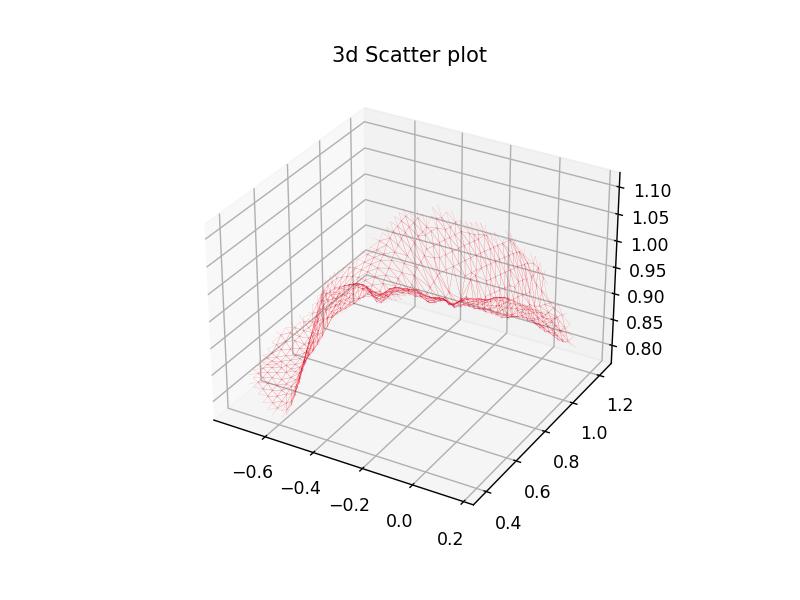

In [86]:
draw3d(test,0.001,0.05)

In [86]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [87]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [88]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


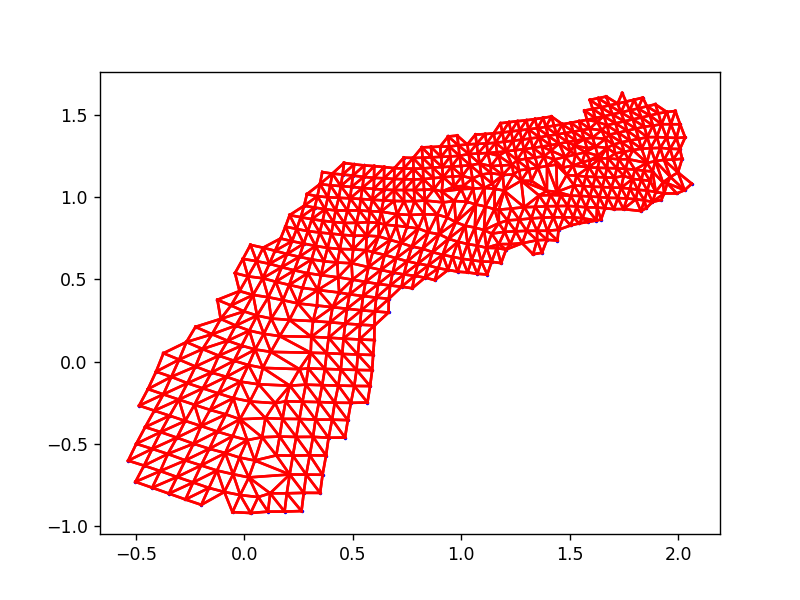

In [90]:
draw(test)

In [89]:
test=[i for i in set(chart_pointclouds_rabbit[1])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


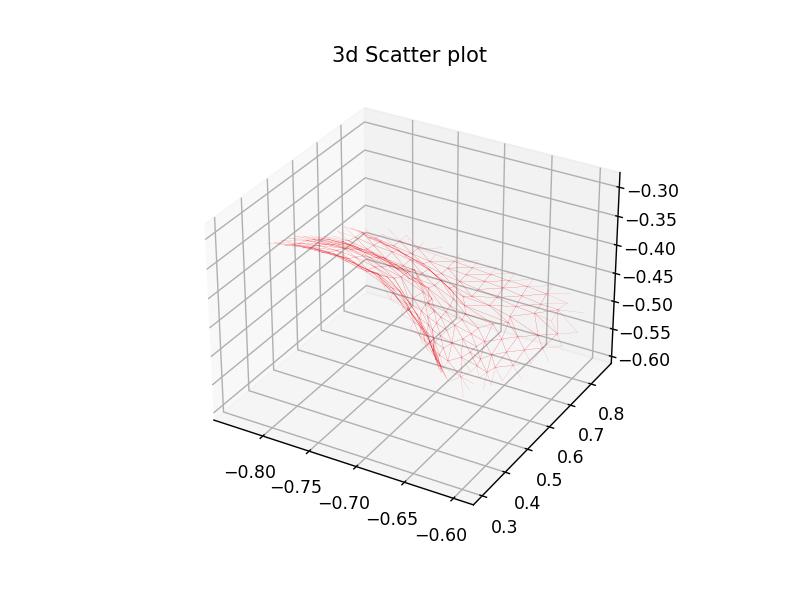

In [402]:
draw3d(test,0.001,0.05)

In [90]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [91]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [92]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


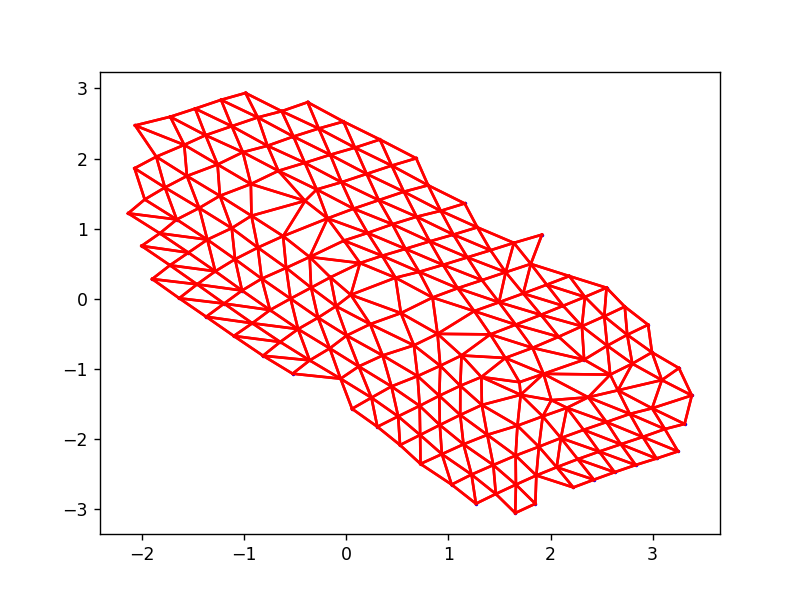

In [256]:
draw(test)

In [93]:
test=[i for i in set(chart_pointclouds_rabbit[2])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


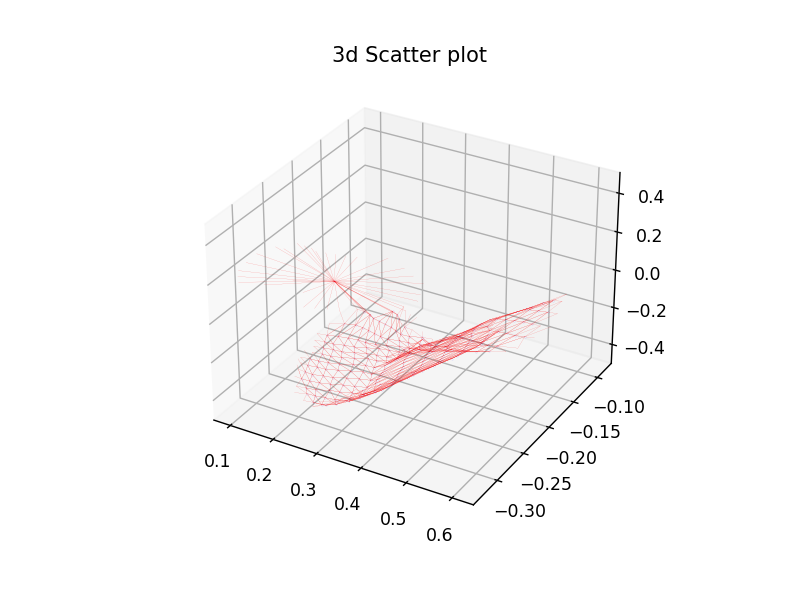

In [407]:
draw3d(test,0.001,0.05)

In [94]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [95]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [96]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


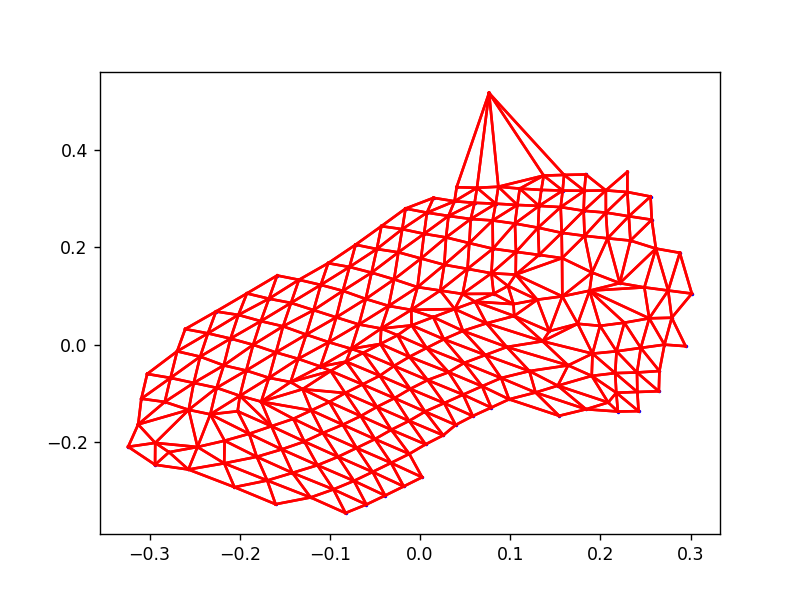

In [99]:
draw(test)

In [97]:
test=[i for i in set(chart_pointclouds_rabbit[3])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


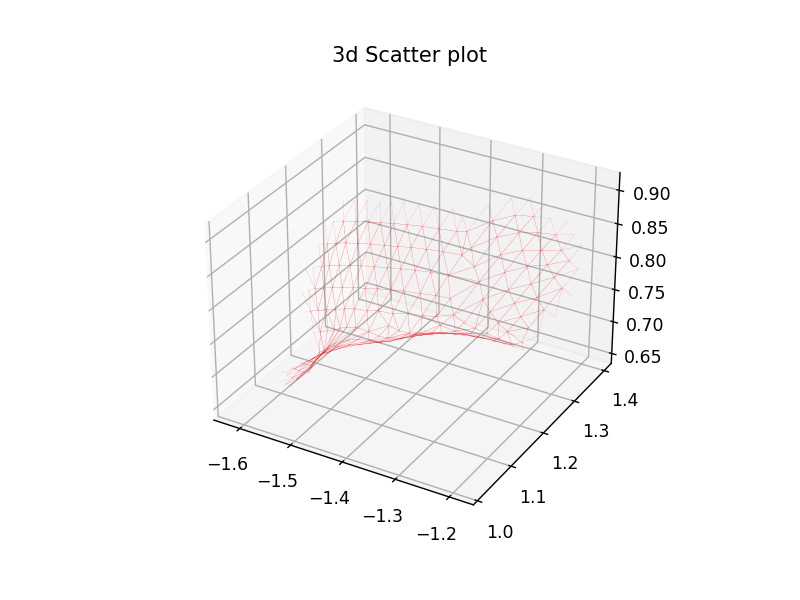

In [413]:
draw3d(test,0.001,0.05)

In [98]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [99]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [100]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


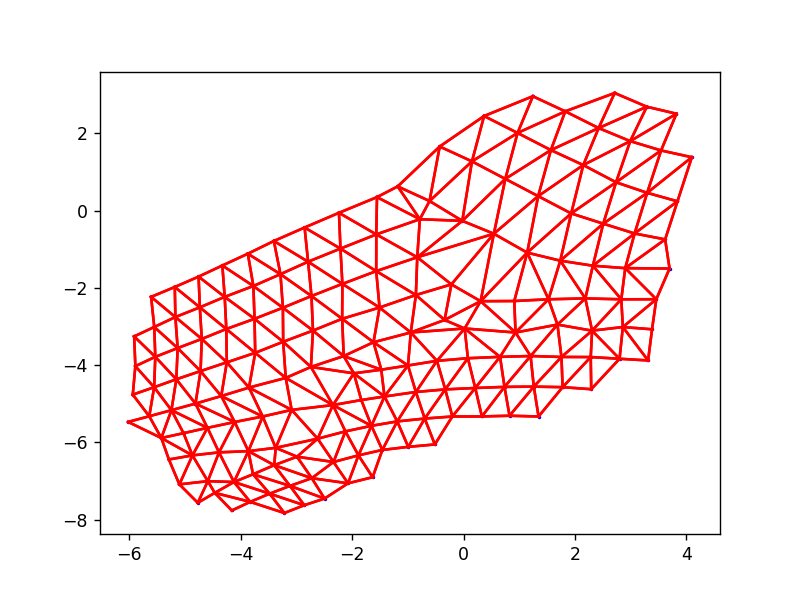

In [416]:
draw(test)

In [101]:
test=[i for i in set(chart_pointclouds_rabbit[4])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


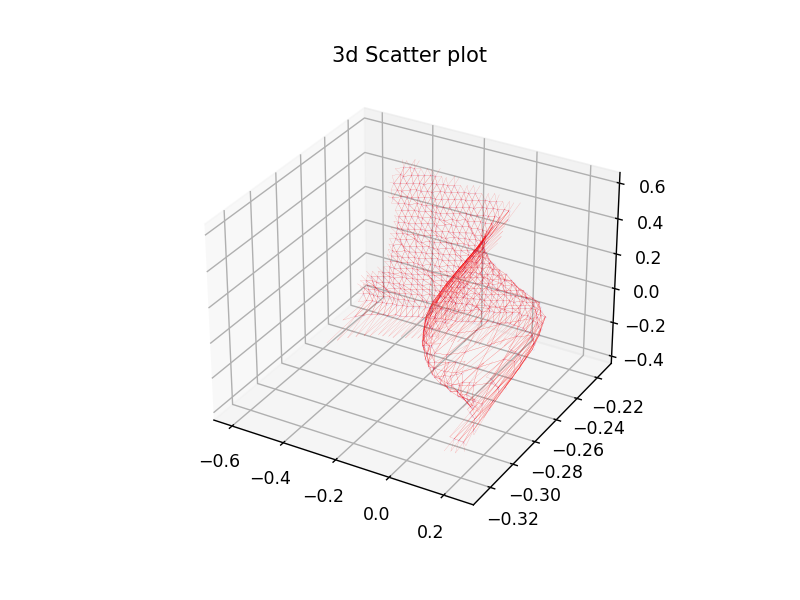

In [418]:
draw3d(test,0.001,0.05)

In [102]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [103]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [104]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


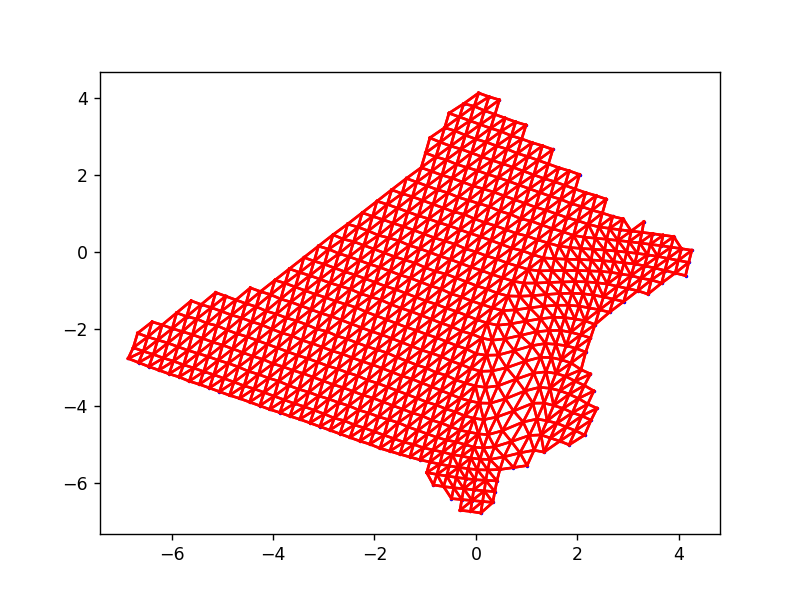

In [421]:
draw(test)

In [105]:
test=[i for i in set(chart_pointclouds_rabbit[5])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


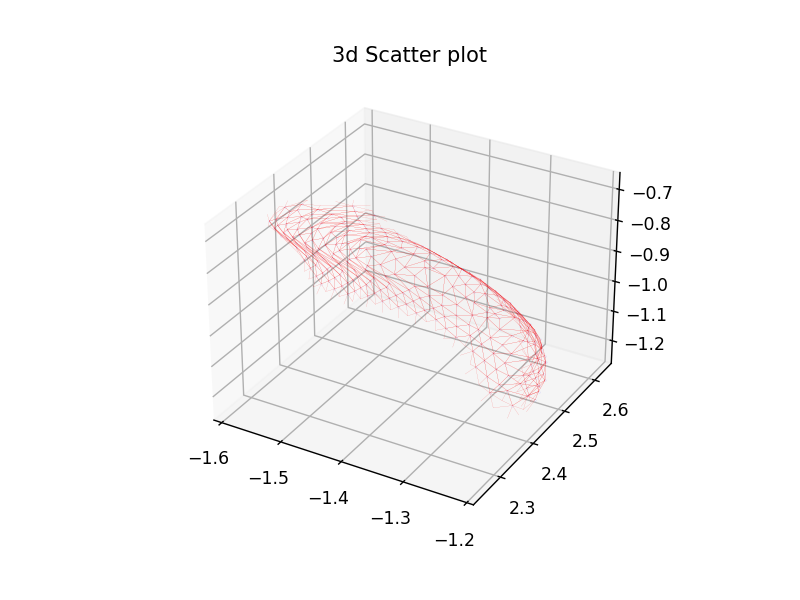

In [423]:
draw3d(test,0.001,0.05)

In [106]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [107]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [108]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


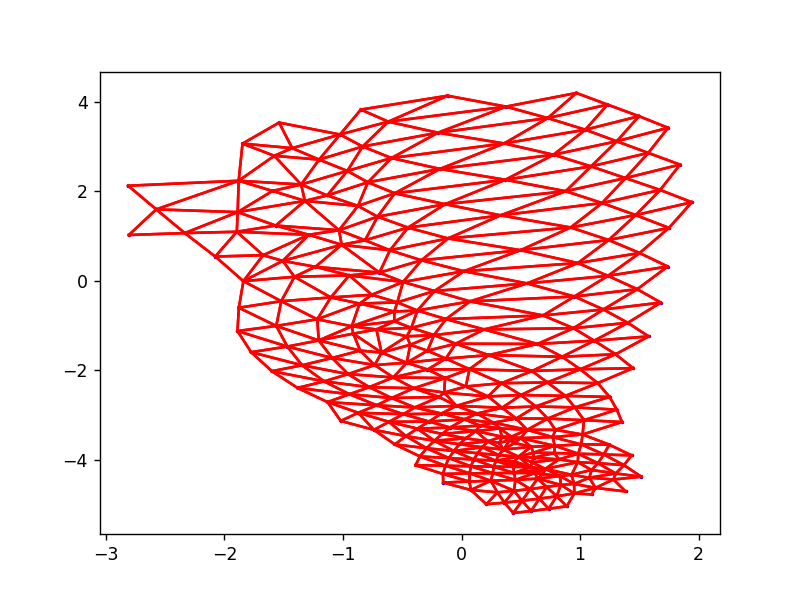

In [426]:
draw(test)

In [109]:
test=[i for i in set(chart_pointclouds_rabbit[6])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

C:\Users\Junkai XIA\AppData\Local\Temp\ipykernel_18584\2419596253.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


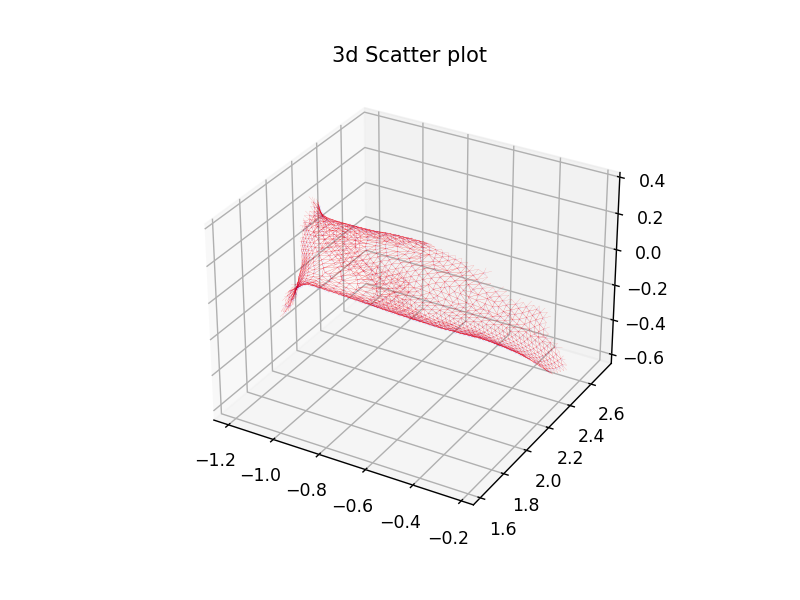

In [428]:
draw3d(test,0.001,0.05)

In [110]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [111]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [112]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


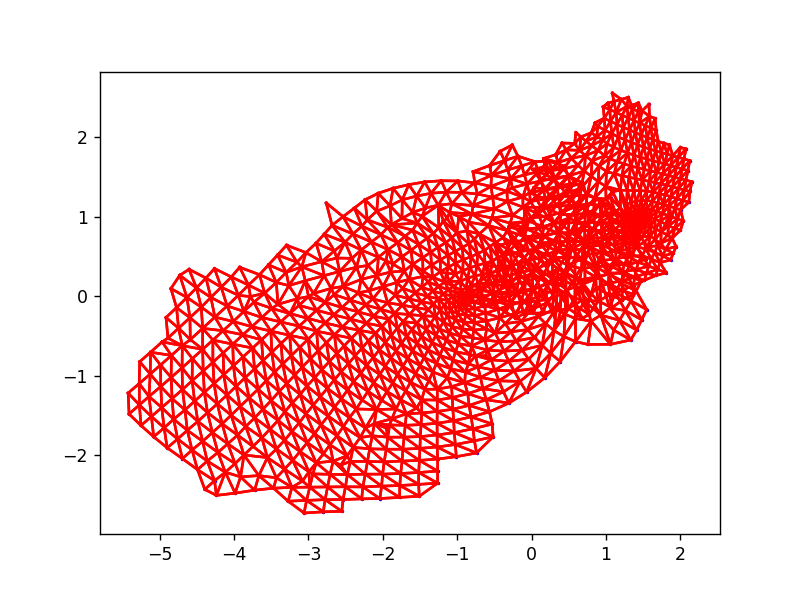

In [431]:
draw(test)

In [111]:
test=[i for i in set(chart_pointclouds_rabbit[7])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)


In [82]:
draw3d(test,0.001,0.05)

<IPython.core.display.Javascript object>

In [83]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [ ]:
projection(test,test,ftest)

In [ ]:
draw(test)

In [113]:
test=[i for i in set(chart_pointclouds_rabbit[8])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


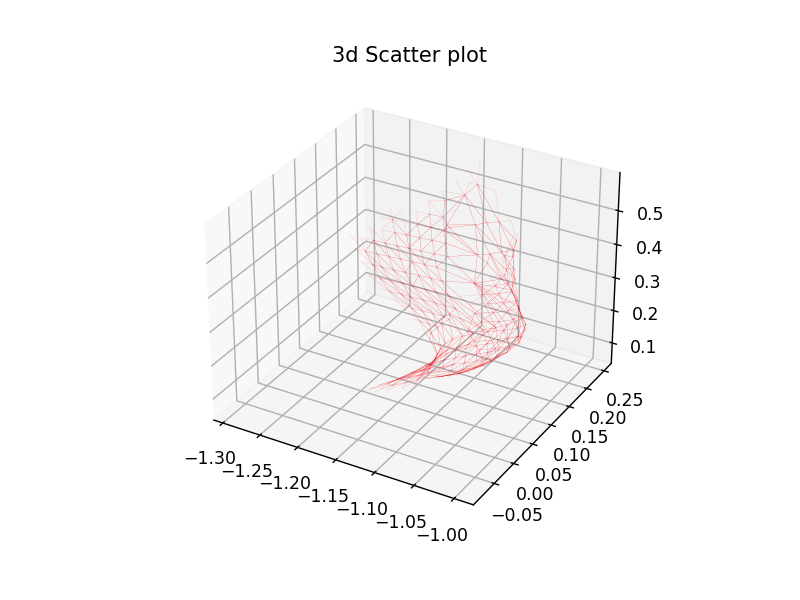

In [119]:
draw3d(test,0.001,0.05)

In [114]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [115]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [116]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


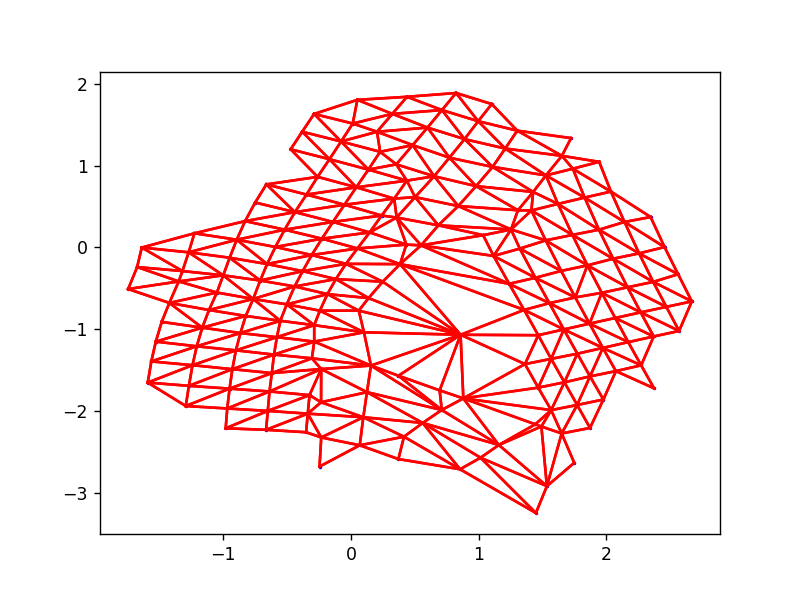

In [440]:
draw(test)

In [117]:
test=[i for i in set(chart_pointclouds_rabbit[9])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


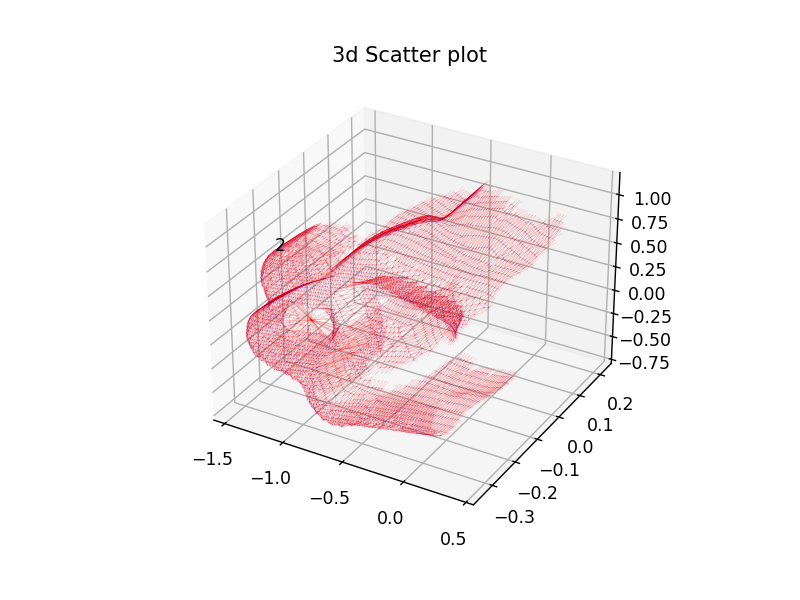

In [442]:
draw3d(test,0.001,0.05)

In [118]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [119]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [120]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


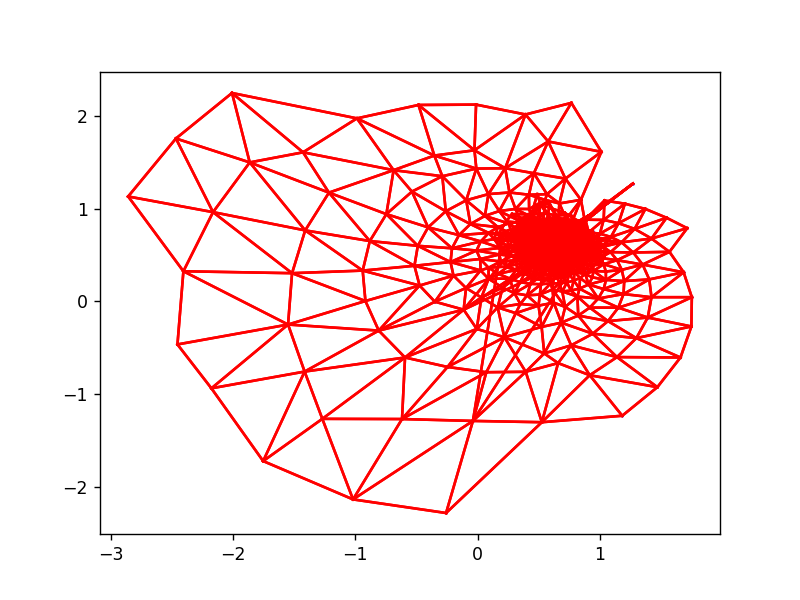

In [446]:
draw(test,pointsize=0.1)

In [121]:
test=[i for i in set(chart_pointclouds_rabbit[10])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


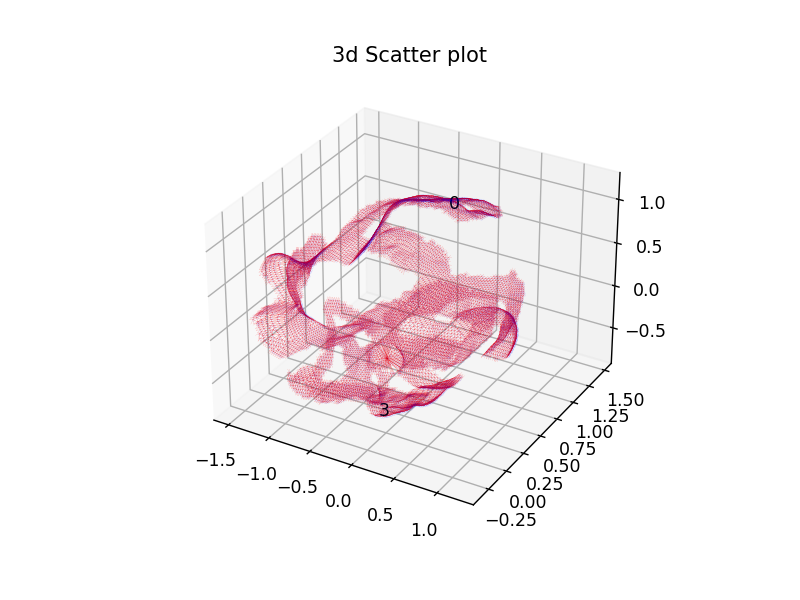

In [82]:
draw3d(test,0.001,0.05)

In [122]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [ ]:
projection(test,test,ftest)

<IPython.core.display.Javascript object>


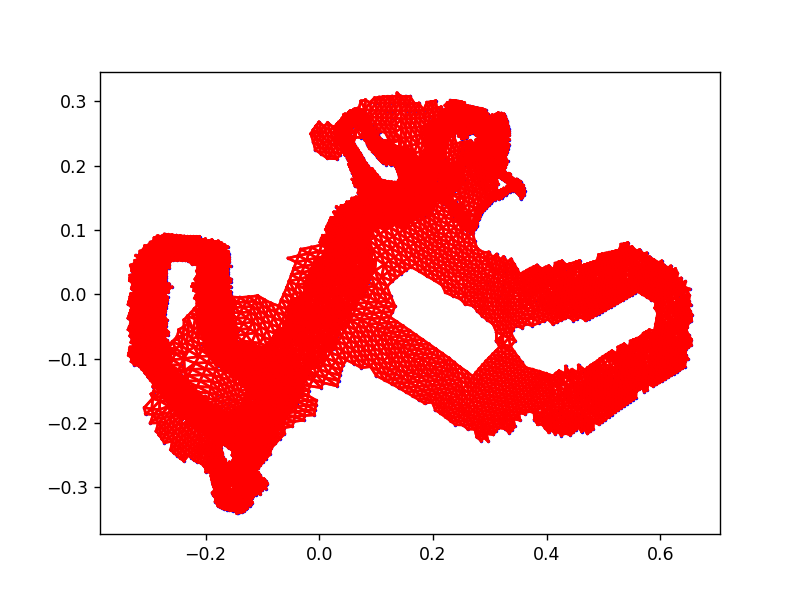

In [85]:
draw(test)

In [362]:
test=[i for i in set(chart_pointclouds_rabbit[11])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


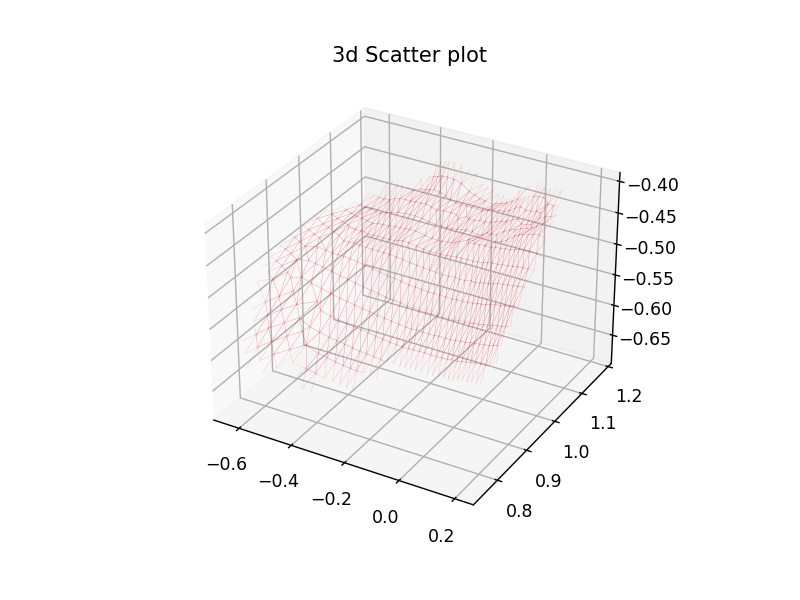

In [87]:
draw3d(test,0.001,0.05)

In [363]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [364]:
projection(test,test,ftest)

<IPython.core.display.Javascript object>


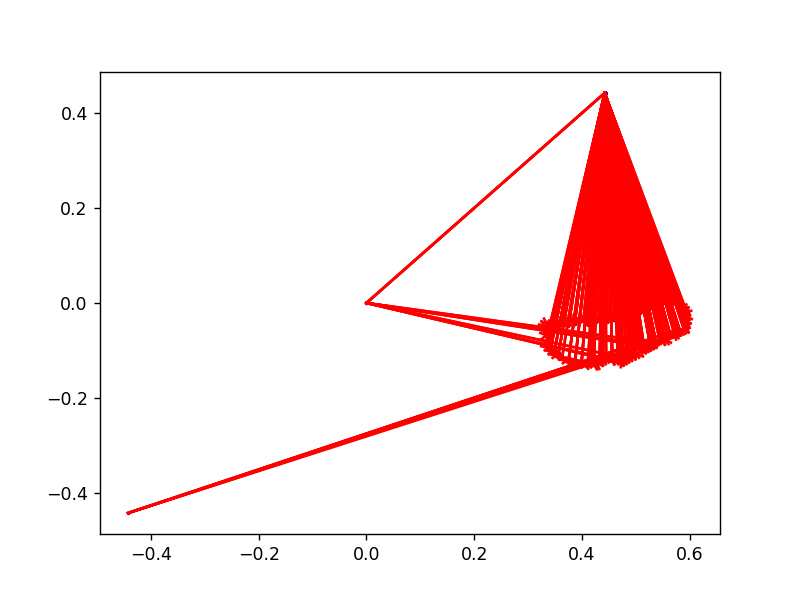

In [90]:
draw(test)

In [121]:
test=[i for i in set(chart_pointclouds_rabbit[12])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


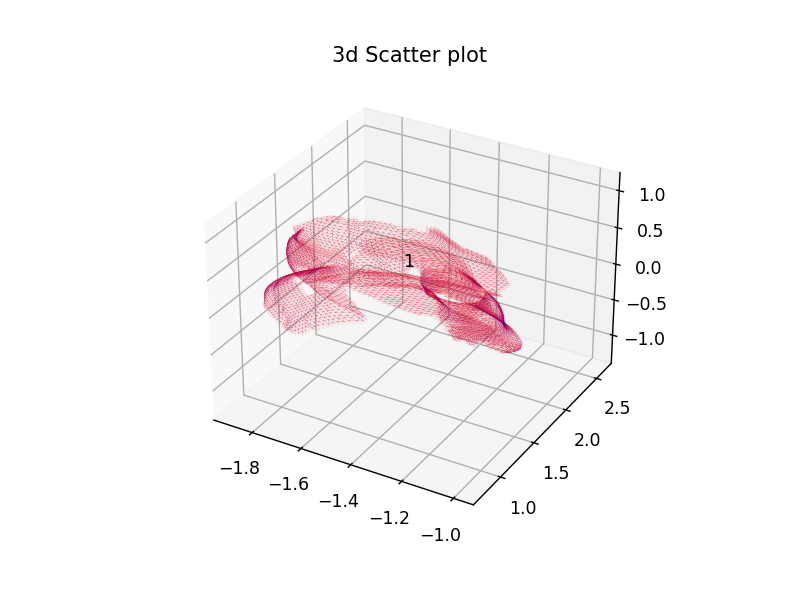

In [92]:
draw3d(test,0.001,0.05)

In [122]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [123]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [124]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


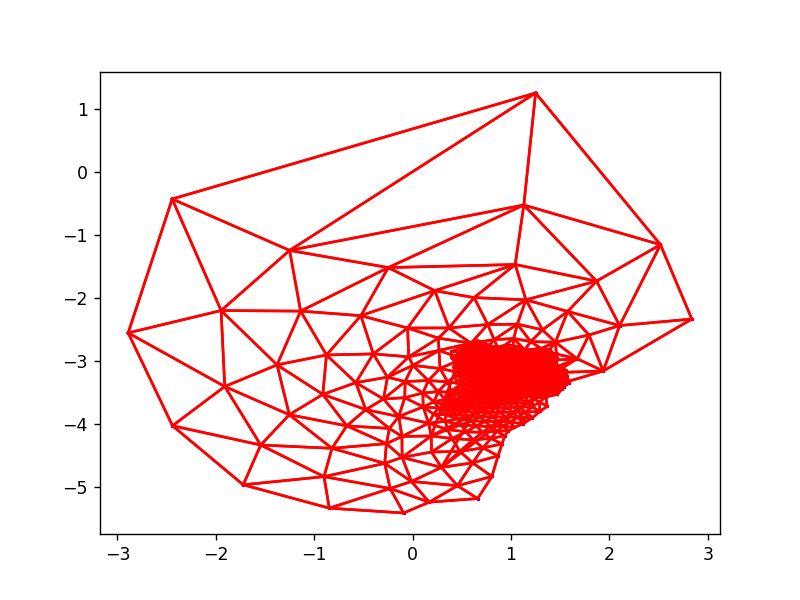

In [95]:
draw(test)

In [369]:
test=[i for i in set(chart_pointclouds_rabbit[13])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


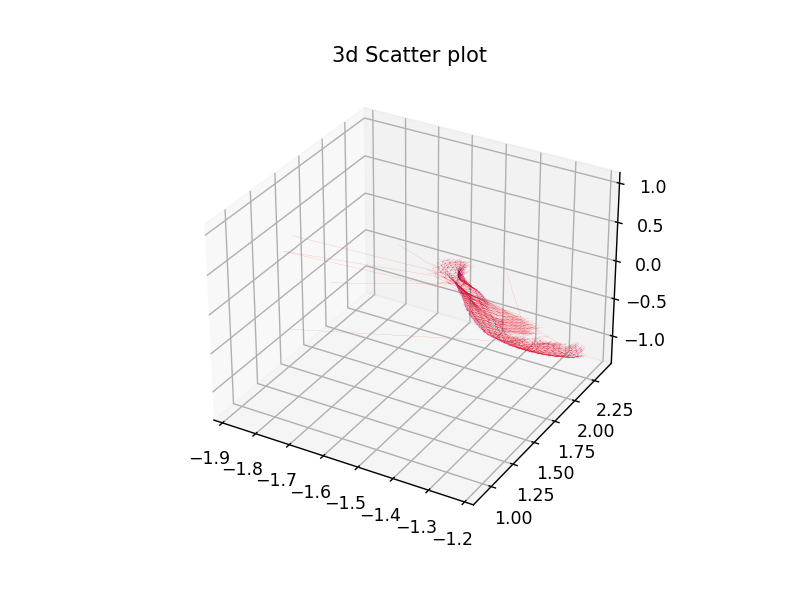

In [97]:
draw3d(test,0.001,0.05)

In [370]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [371]:
projection(test,test,ftest)

<IPython.core.display.Javascript object>


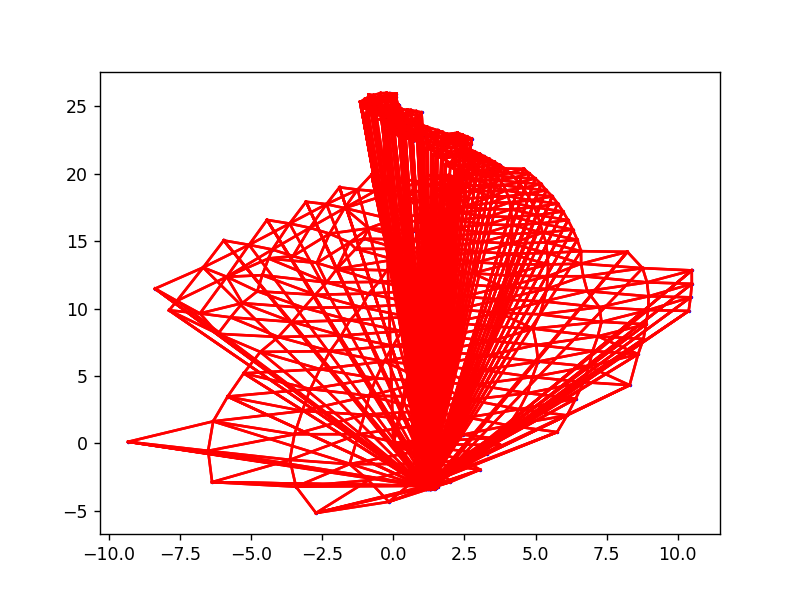

In [100]:
draw(test)

In [372]:
test=[i for i in set(chart_pointclouds_rabbit[14])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


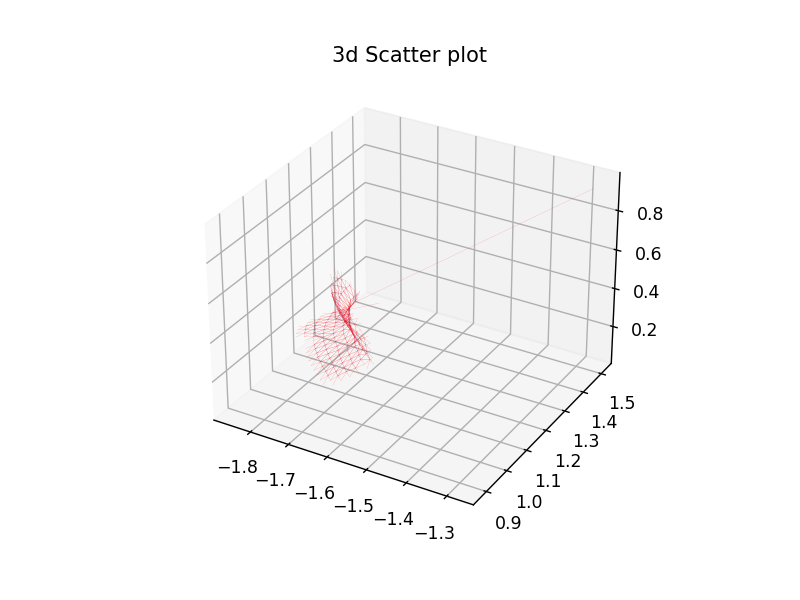

In [102]:
draw3d(test,0.001,0.05)

In [373]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [374]:
projection(test,test,ftest)

<IPython.core.display.Javascript object>


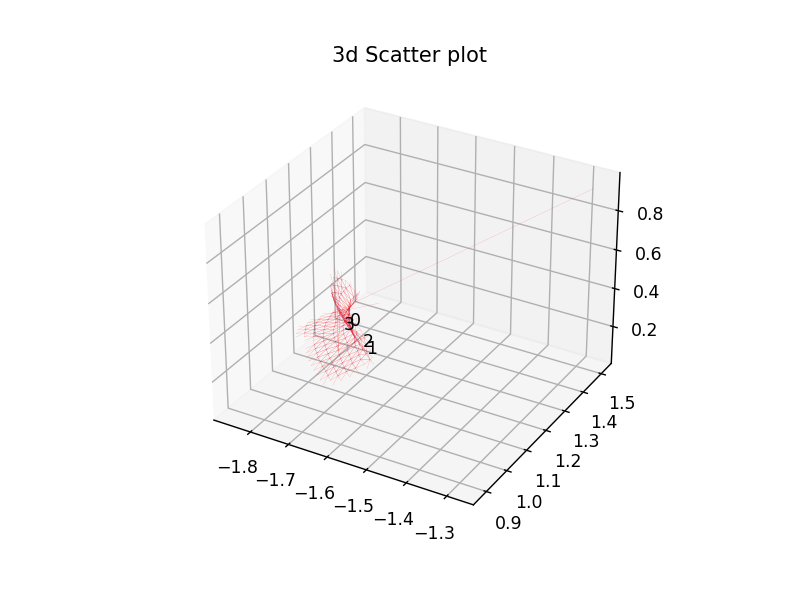

In [105]:
draw(test)

In [125]:
test=[i for i in set(chart_pointclouds_rabbit[15])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


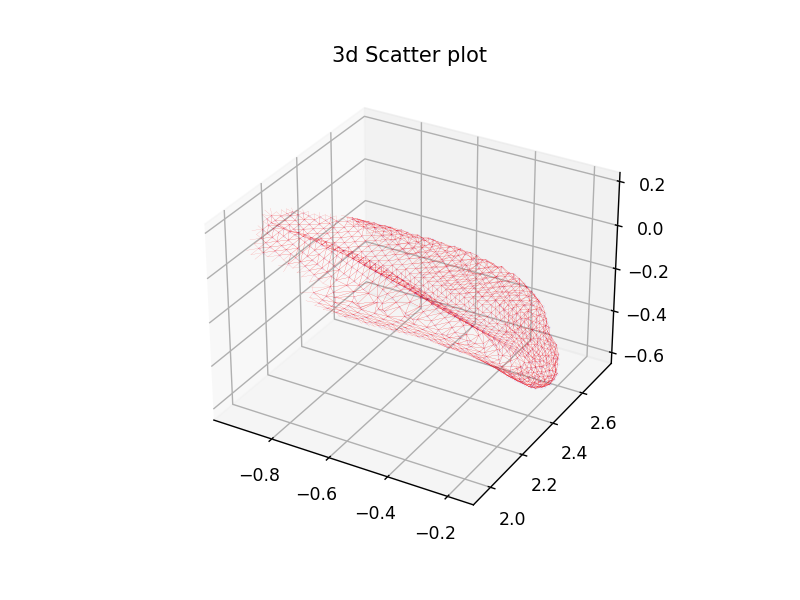

In [107]:
draw3d(test,0.001,0.05)

In [126]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [127]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [128]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


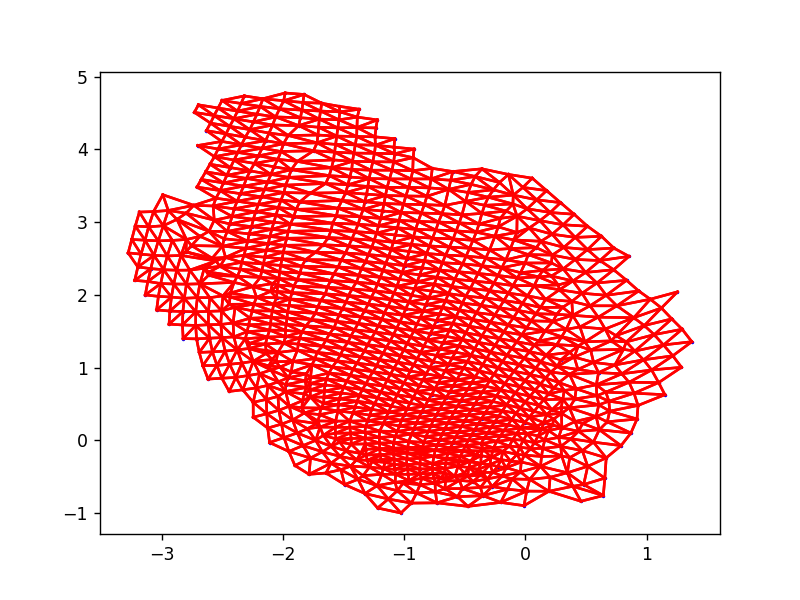

In [110]:
draw(test)

In [129]:
test=[i for i in set(chart_pointclouds_rabbit[16])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


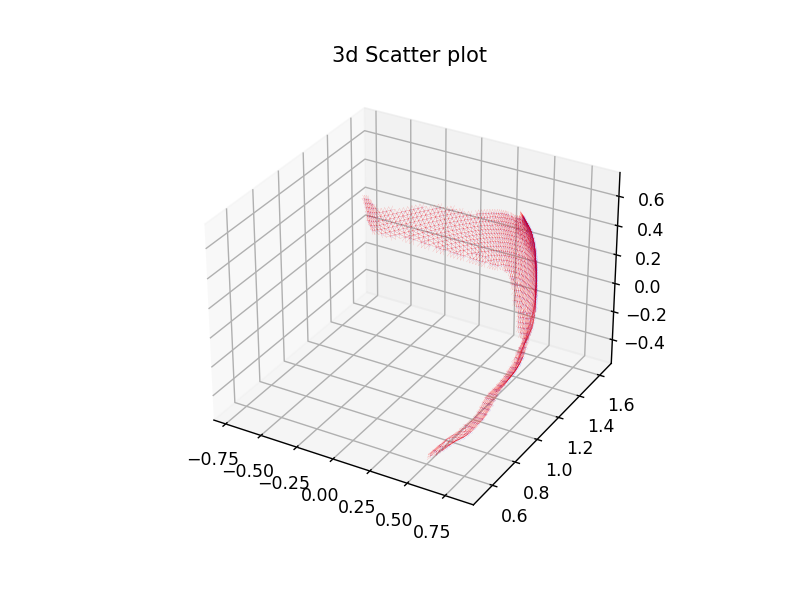

In [472]:
draw3d(test,0.001,0.05)

In [130]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [131]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [132]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


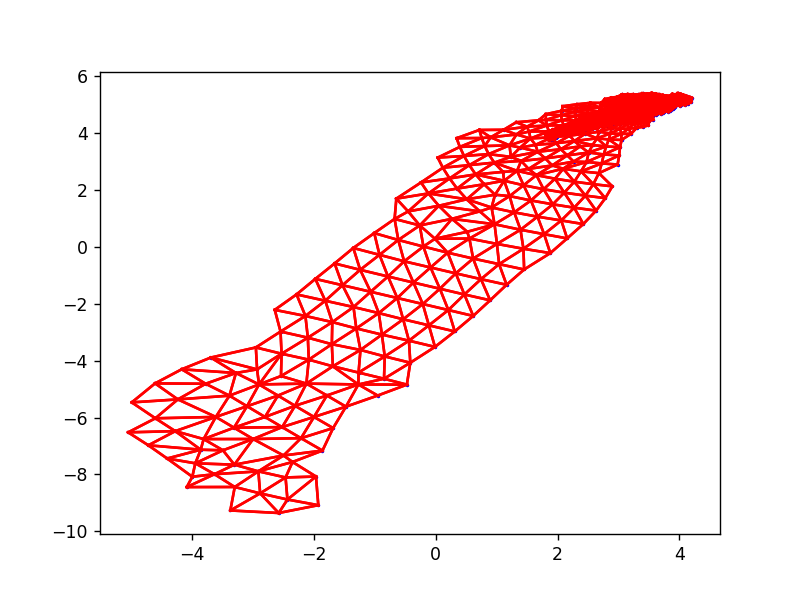

In [475]:
draw(test)

In [133]:
test=[i for i in set(chart_pointclouds_rabbit[17])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


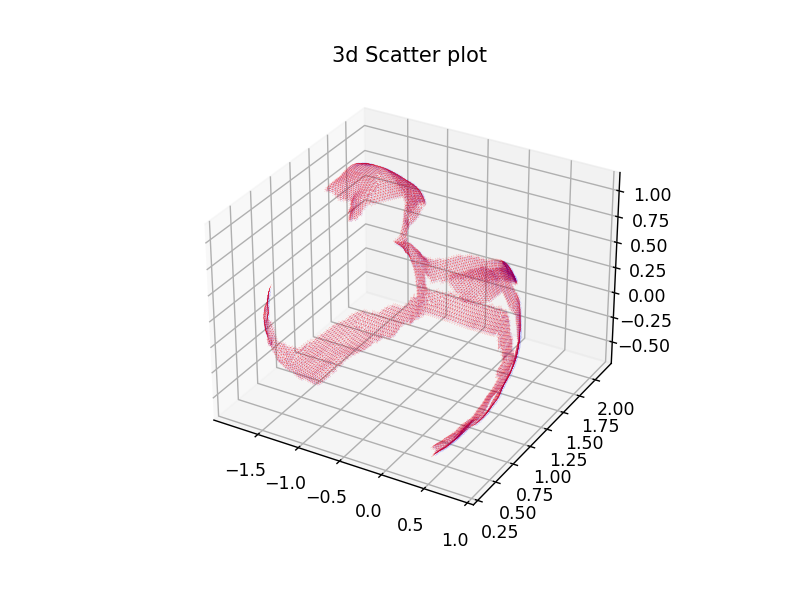

In [112]:
draw3d(test,0.001,0.05)

In [134]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [135]:
projection(test,test,ftest)
uvs=save_uvs(test)

In [136]:
all_charts.append(test)
face_charts.append(ftest)
all_uvs.append(uvs)

<IPython.core.display.Javascript object>


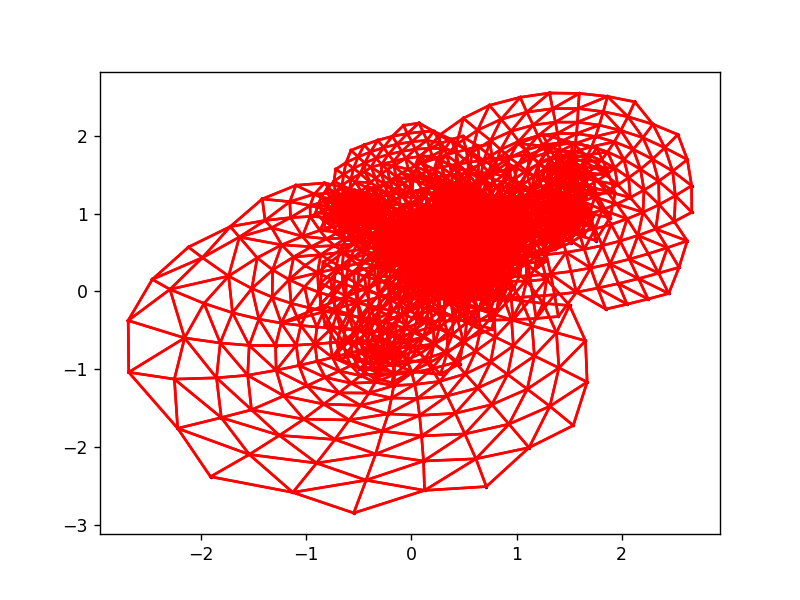

In [115]:
draw(test)

In [387]:
test=[i for i in set(chart_pointclouds_rabbit[18])]
ftest=face_correspond(test,pointcloud_rabbit,face_rabbit)

<IPython.core.display.Javascript object>


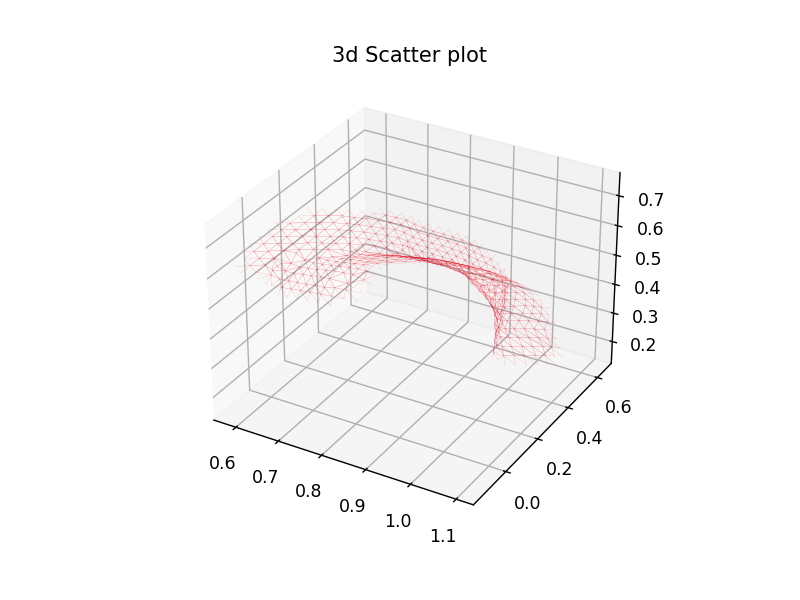

In [117]:
draw3d(test,0.001,0.05)

In [118]:
dictionary={}
i=0
for point in test:
    dictionary[point.index]=i
    point.index=i
    
    i+=1
    
for f in ftest:
    for i in range(len(f)):
        a=f[i]
        b=dictionary[a]
        f[i]=b

In [119]:
projection(test,test,ftest)

<IPython.core.display.Javascript object>


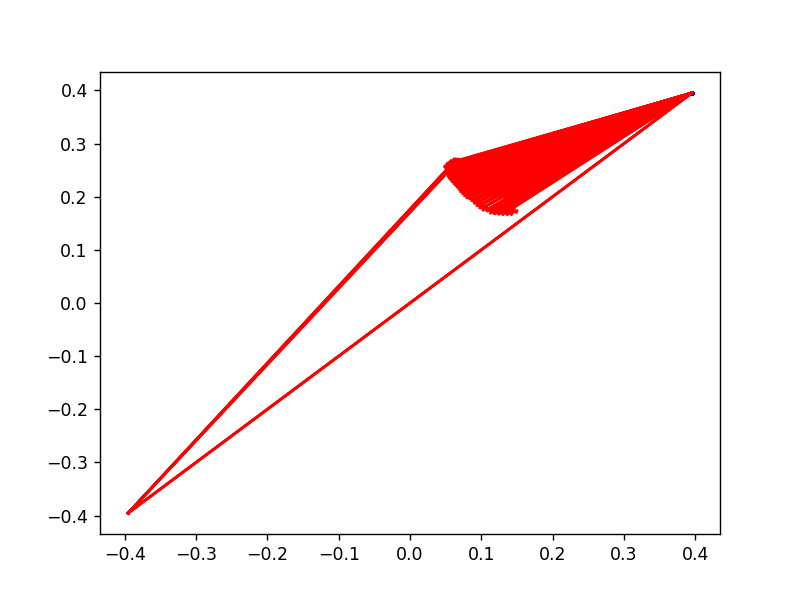

In [120]:
draw(test)

In [137]:
def diameter_pc(pointcloud):
    pts=[]
    for point in pointcloud:
        pts.append([point.u,point.v])
    # print(pts)
    # print(spatial.ConvexHull(pts).vertices[0])
    candidates = [pts[i] for i in spatial.ConvexHull(pts, qhull_options="QJ").vertices]
    us=[]
    vs=[]
    for i in candidates:
        us.append(i[0])
        vs.append(i[1])
    dist_mat = spatial.distance_matrix(candidates, candidates)
    # print(candidates[1])
    i, j = np.unravel_index(dist_mat.argmax(), dist_mat.shape)
    return [candidates[i][0],candidates[i][1],candidates[j][0],candidates[j][1]]

In [138]:
def rotate(pointcloud):
    u1,v1,u2,v2=diameter_pc(pointcloud)
    angle=np.arctan((u2-u1)/(v2-v1))
    # print(angle)
    pointsx=[]
    pointsy=[]
    for p in pointcloud:
        cx=np.cos(angle)*p.u-np.sin(angle)*p.v
        cy=np.sin(angle)*p.u+np.cos(angle)*p.v
        p.u=cx
        p.v=cy
    # return pointsx,pointsy

<IPython.core.display.Javascript object>


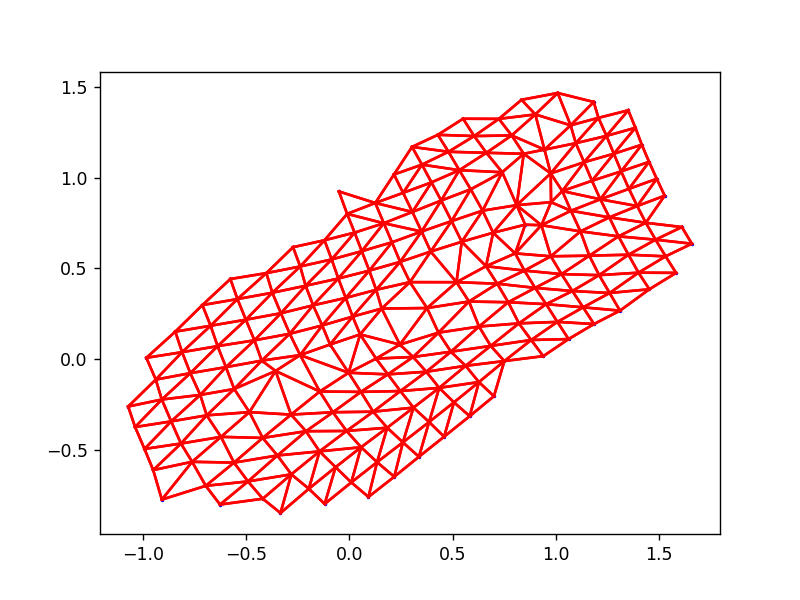

In [210]:
draw(all_charts[1])

In [139]:
for c in all_charts:
    rotate(c)

In [140]:
valid_charts=[all_charts[0],all_charts[1],all_charts[2],all_charts[4],all_charts[7],all_charts[8]]

<IPython.core.display.Javascript object>


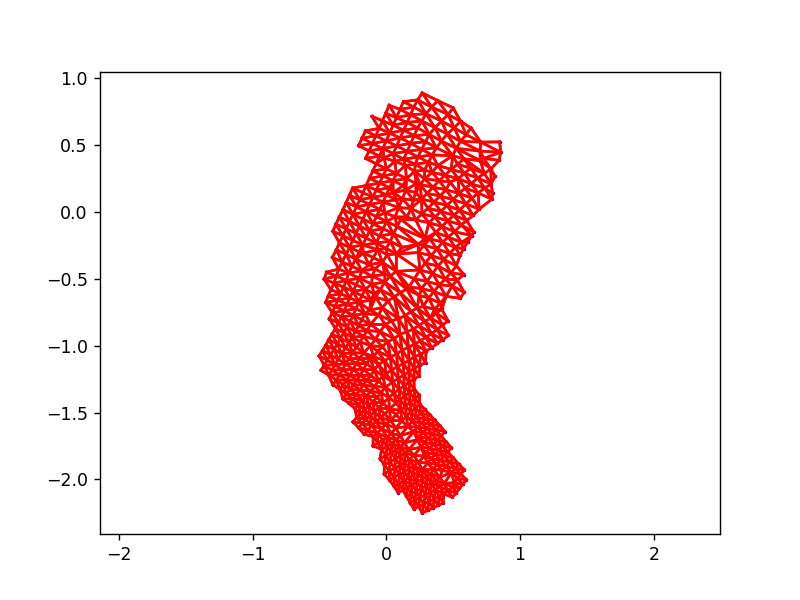

In [432]:
draw(valid_charts[0])

In [141]:
def collect_coords(charts):
    total_coords=[]
    for chart in charts:
        coordu=[]
        coordv=[]
        for p in chart:
            coordu.append(p.u)
            coordv.append(p.v)
        total_coords.append([coordu,coordv])
    return total_coords

In [142]:
uv_charts=collect_coords(all_charts)

In [143]:
uv_charts.remove(uv_charts[7])

In [144]:
colors=['#FF0000','#800080','#2E8B57','#EE82EE','#FFA500','#32CD32','#FF1493','#A9A9A9','#BDB76B','#000000','#00FFFF','#F0F8FF','#DC143C','#9400D3','#B22222','#DAA520']

In [145]:
def draw_uv(chart,color='b',pointsize=0.4):
    fig = plt.figure()
    ax = plt.axes()
    ax.scatter(chart[0],chart[1],s=pointsize,c=color)
    ax.axis("equal") 
    plt.show()

<IPython.core.display.Javascript object>


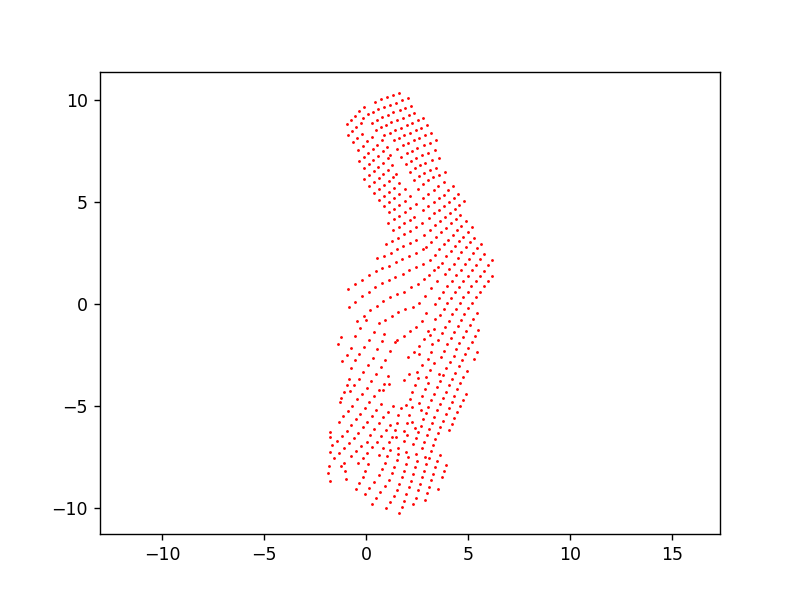

<IPython.core.display.Javascript object>


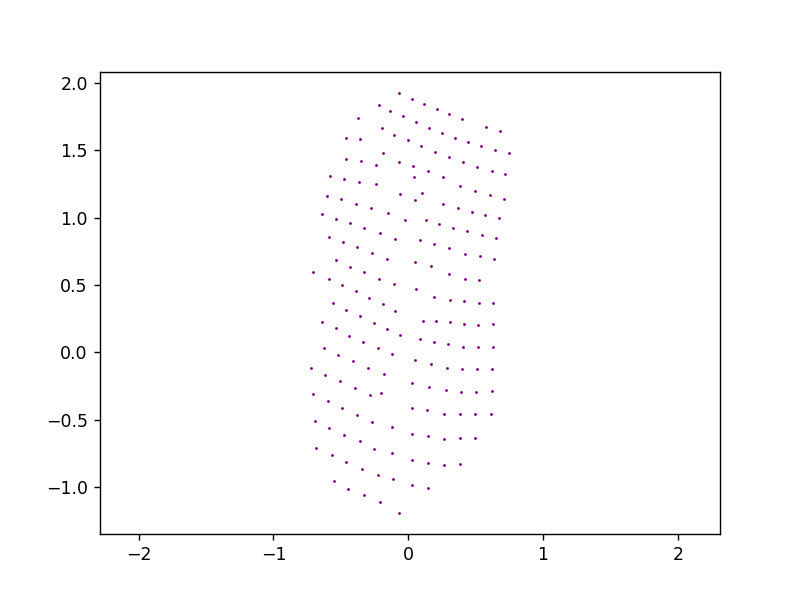

<IPython.core.display.Javascript object>


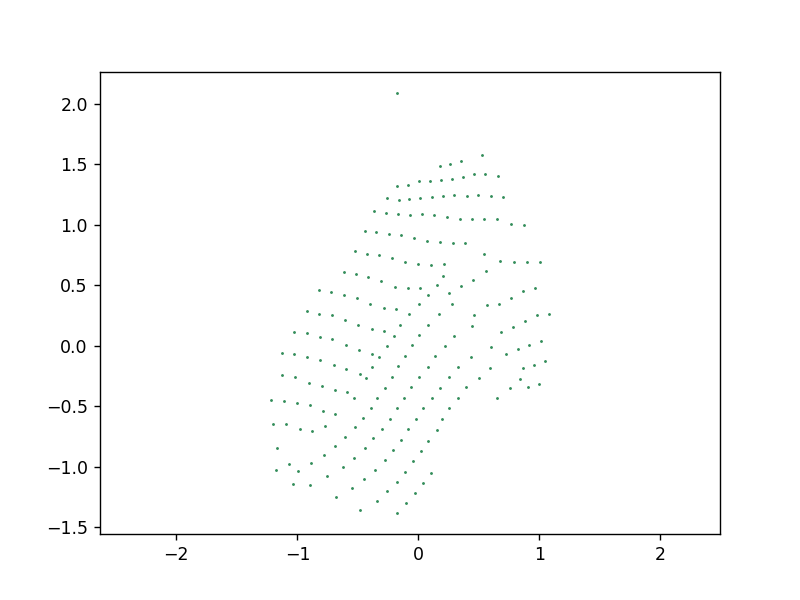

<IPython.core.display.Javascript object>


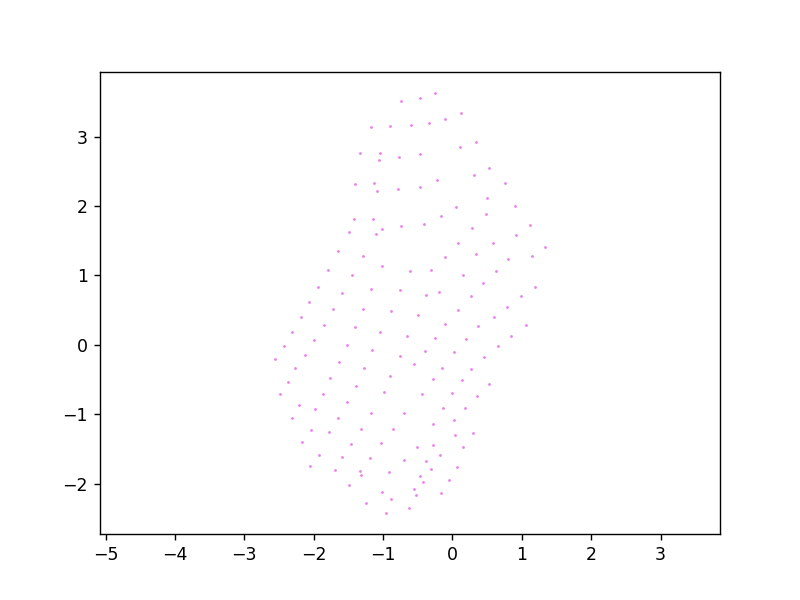

<IPython.core.display.Javascript object>


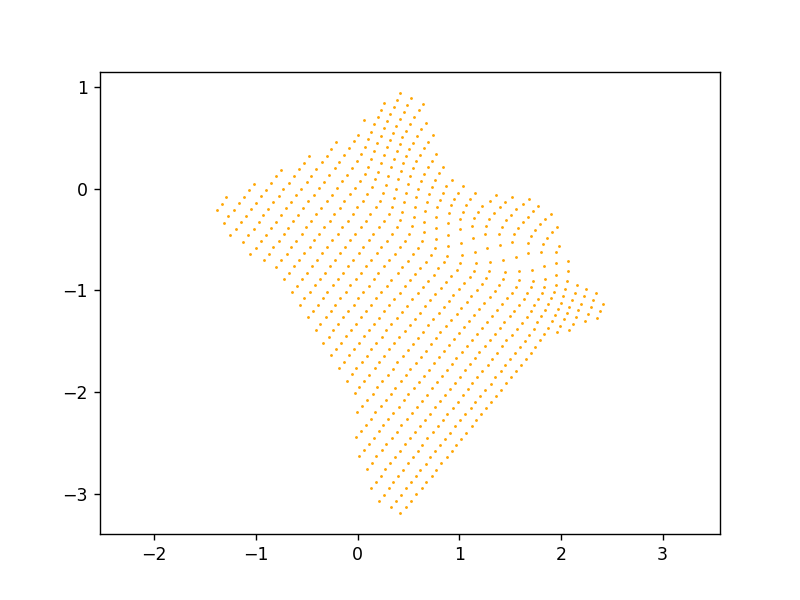

<IPython.core.display.Javascript object>


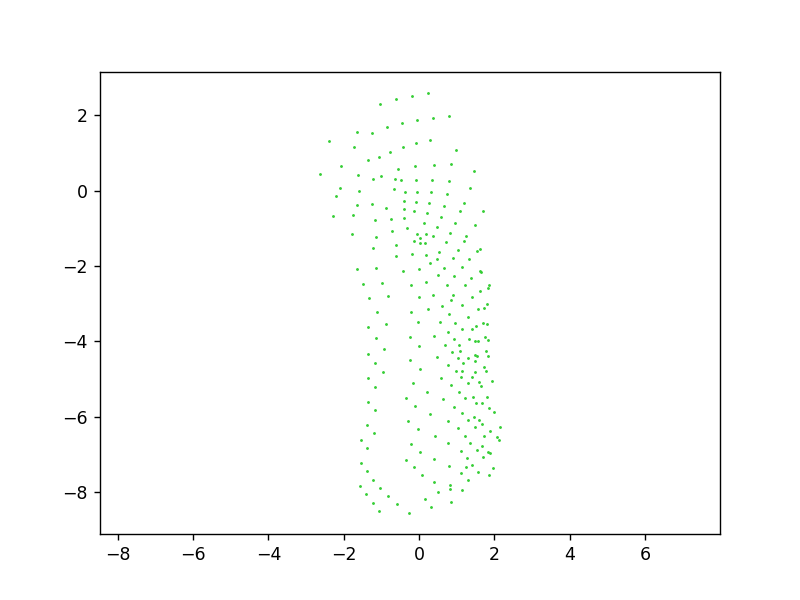

<IPython.core.display.Javascript object>


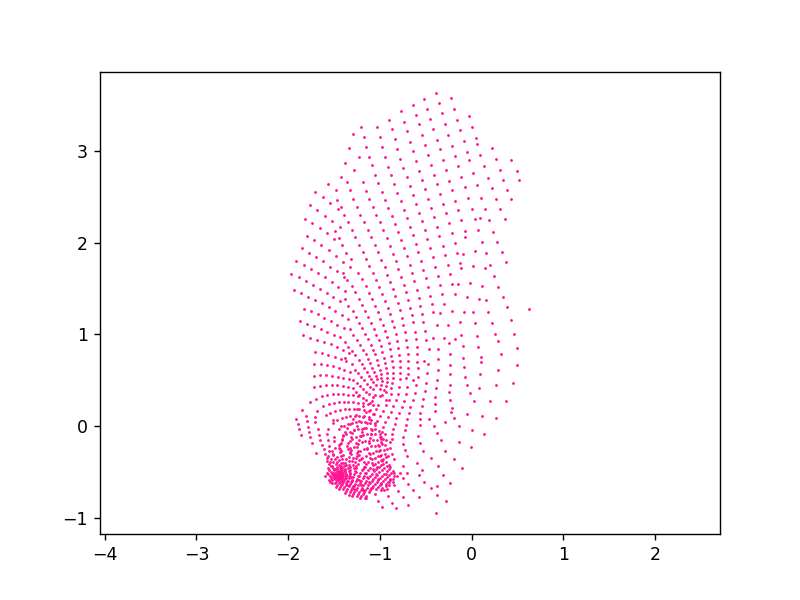

<IPython.core.display.Javascript object>


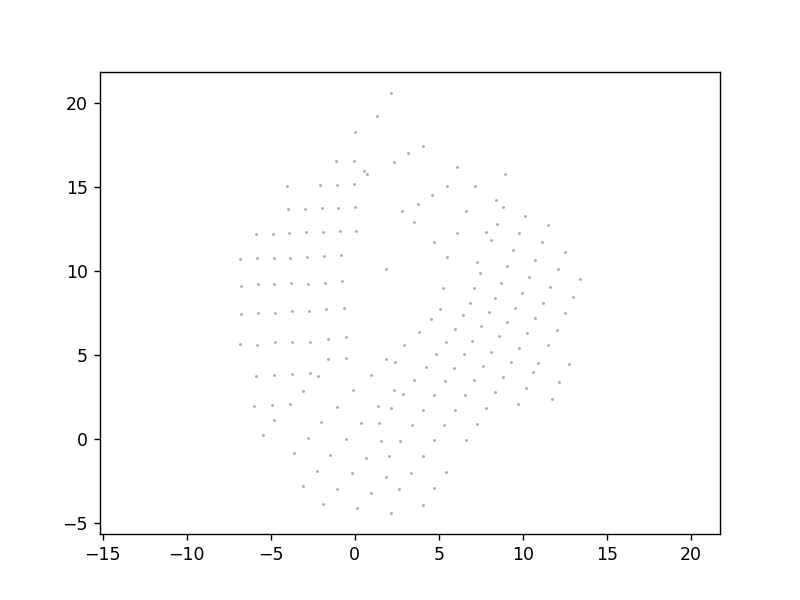

<IPython.core.display.Javascript object>


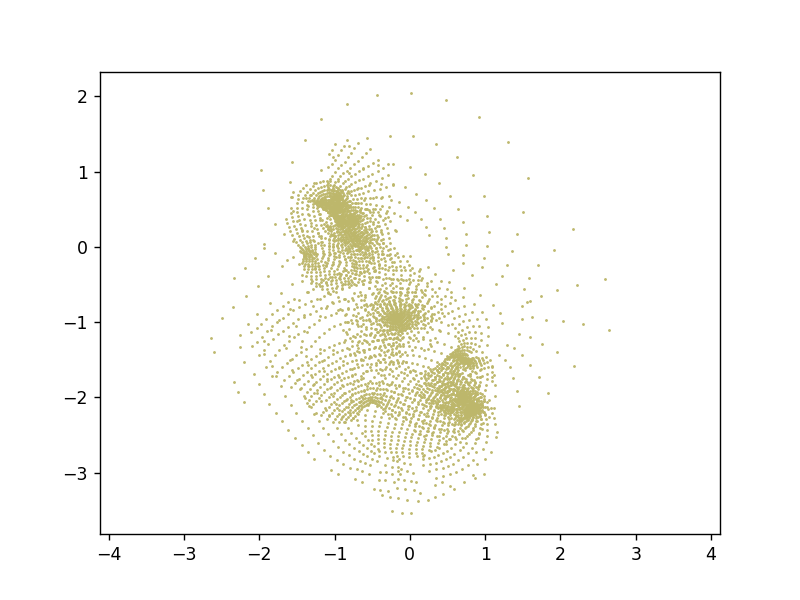

<IPython.core.display.Javascript object>


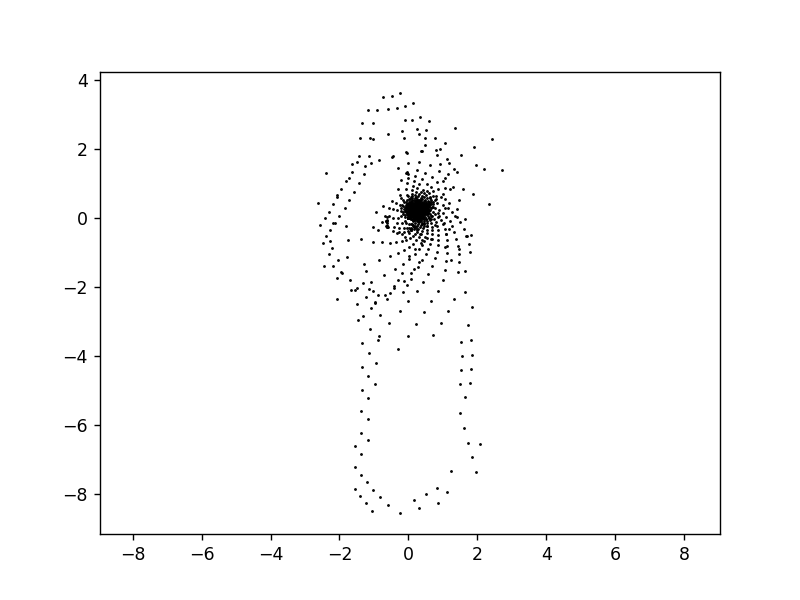

<IPython.core.display.Javascript object>


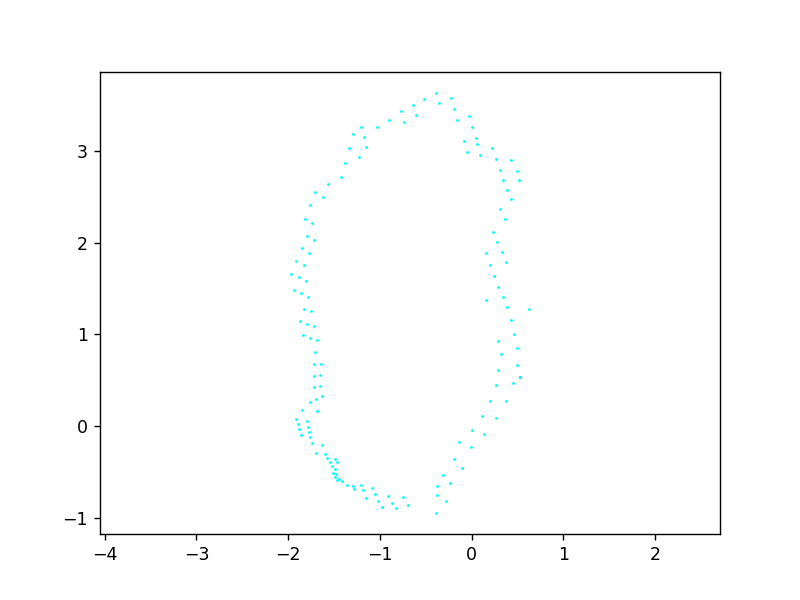

<IPython.core.display.Javascript object>


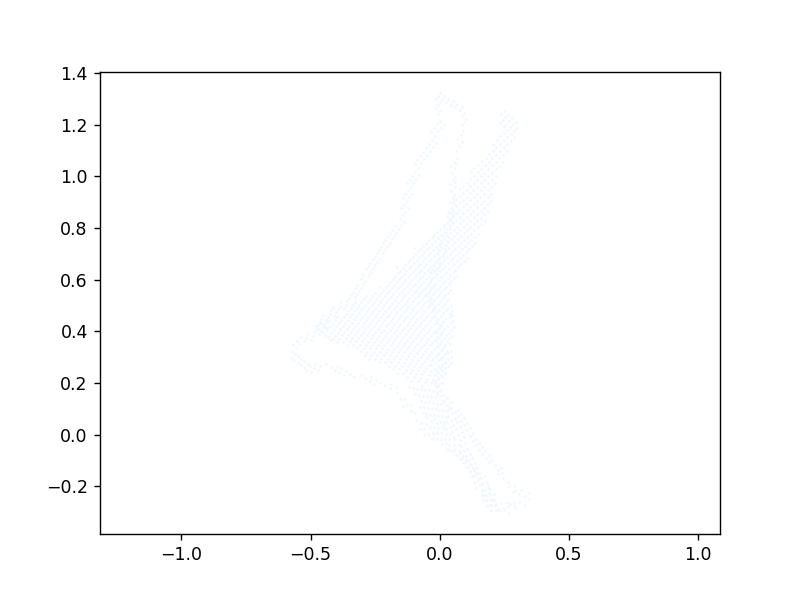

<IPython.core.display.Javascript object>


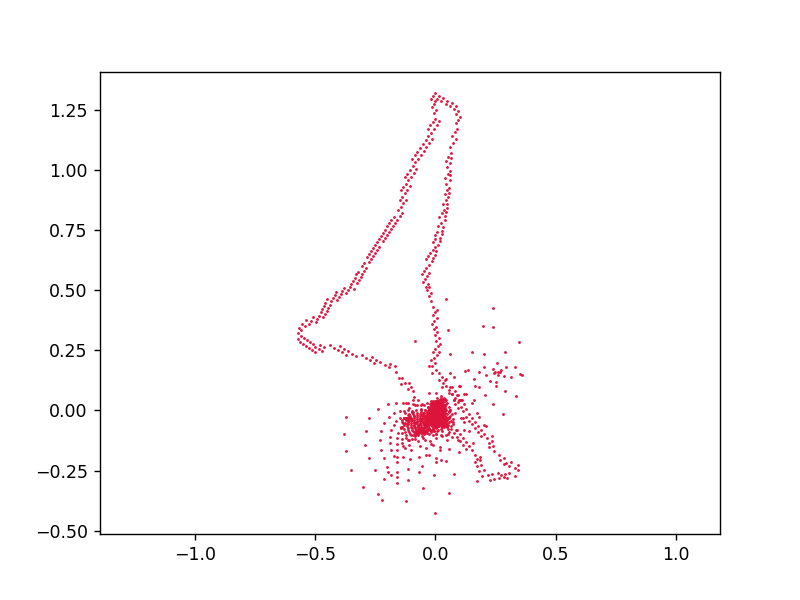

In [258]:
color_uv_charts=0
for chart in uv_charts:    
    co=colors[color_uv_charts]
    draw_uv(chart,color=co)
    color_uv_charts+=1

<IPython.core.display.Javascript object>


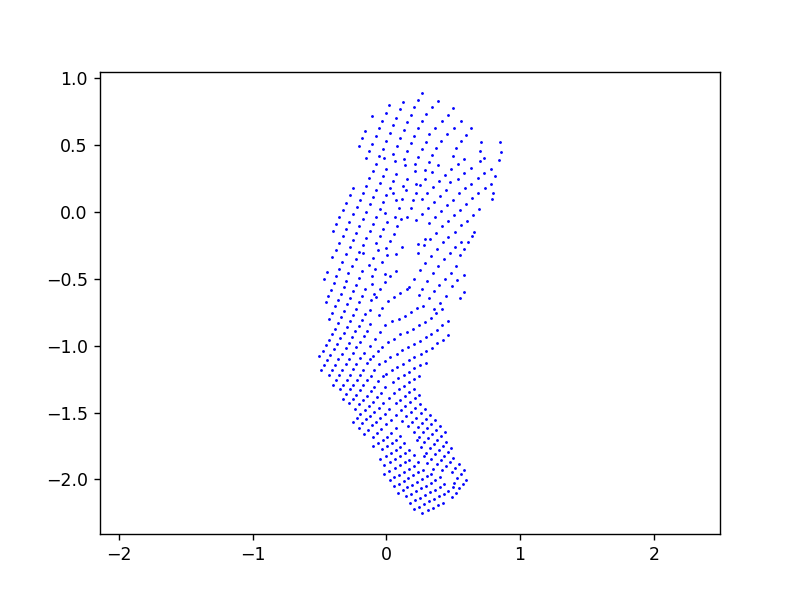

In [157]:
draw_uv(uv_charts[0])

In [146]:
def boundaries(chart,margin=0.1):
    pts=[[u,v] for u,v in zip(chart[0],chart[1]) ]
    candidates = [pts[i] for i in spatial.ConvexHull(pts, qhull_options="QJ").vertices]
    point_left=candidates[np.argmin(np.array(candidates)[:,0])]
    point_right=candidates[np.argmax(np.array(candidates)[:,0])]
    upperbounds=[]
    lowerbounds=[]
    
    point_middle=(point_left[0]+point_right[0])/2
    
    for point in candidates:
        if point[0]<point_middle:
            if point[1]>point_left[1]:
                upperbounds.append(point)
            else:
                lowerbounds.append(point)
        else:
            if point[1]>point_right[1]:
                upperbounds.append(point)
            else:
                lowerbounds.append(point)
                
        upperbounds.sort(key=lambda x:x[0])
        lowerbounds.sort(key=lambda x:x[0])
    
    for i in upperbounds:
        i[1]+=margin
        
    for i in lowerbounds:
        i[1]-=margin
    
    return upperbounds,lowerbounds
        

In [147]:
def draw_uv_boundaries(chart,upperbounds,lowerbounds,color='b',pointsize=0.4):
    fig = plt.figure()
    ax = plt.axes()
    ax.scatter(chart[0],chart[1],s=pointsize,c=color)
    for p in upperbounds:
        ax.scatter(p[0],p[1],s=50*pointsize,c='r')
    for p in lowerbounds:
        ax.scatter(p[0],p[1],s=50*pointsize,c='r')
    for i in range(len(upperbounds)-1):
        ax.plot([upperbounds[i][0],upperbounds[i+1][0]],[upperbounds[i][1],upperbounds[i+1][1]])
    
    for i in range(len(lowerbounds)-1):
        ax.plot([lowerbounds[i][0],lowerbounds[i+1][0]],[lowerbounds[i][1],lowerbounds[i+1][1]])
        
    ax.plot([upperbounds[0][0],lowerbounds[0][0]],[upperbounds[0][1],lowerbounds[0][1]])
    ax.plot([upperbounds[len(upperbounds)-1][0],lowerbounds[len(lowerbounds)-1][0]],[upperbounds[len(upperbounds)-1][1],lowerbounds[len(lowerbounds)-1][1]])
    ax.axis("equal") 
    plt.show()

<IPython.core.display.Javascript object>


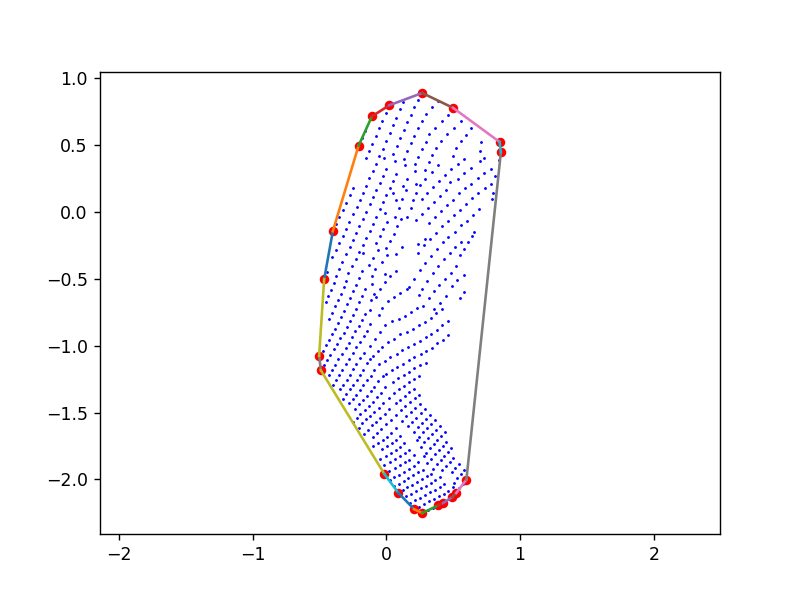

In [500]:
draw_uv_boundaries(uv_charts[0],ub,lb)

In [148]:
def corner(chart):
    minx=min(chart[0])
    miny=min(chart[1])
    maxx=max(chart[0])
    maxy=max(chart[1])
    return minx,miny,maxx,maxy

In [149]:
def create_packing(charts):
    lx=0
    ly=0
    rects=[]
    for chart in charts:
        minx,miny,maxx,maxy=corner(chart)
        # print(maxx-minx)
        # print(maxy-miny)
        rects.append((maxx-minx,maxy-miny))
        lx+=maxx-minx
        ly+=maxy-miny
    
    lx/=2
    ly/=2
    return rects,[lx,ly]

In [150]:
rectangle,area=create_packing(uv_charts)

In [151]:
def solve_packing(rects):
    problem = rps.Problem(rectangles=rects)
    solution = rps.Solver().solve(problem=problem)
    return solution

In [152]:
solution_uv=solve_packing(rectangle)

In [153]:
def adjust_coords(charts,solution):
    for i in range(len(charts)):
        chart=charts[i]
        minx,miny,maxx,maxy=corner(chart)
        info=solution.floorplan.positions[i]
        for j in range(len(chart[0])):
            chart[0][j]+=(info["x"]-minx)
        for j in range(len(chart[1])):
        
            chart[1][j]+=(info["y"]-miny)

In [154]:
adjust_coords(uv_charts,solution_uv)

In [155]:
def draw_all_charts(charts,colors,pointsize=0.4):
    fig = plt.figure()
    ax = plt.axes()
    for i in range(len(charts)):
        chart=charts[i]
        ax.scatter(chart[0],chart[1],s=pointsize,c=colors[i])
    ax.axis("equal")  
    plt.show()

<IPython.core.display.Javascript object>


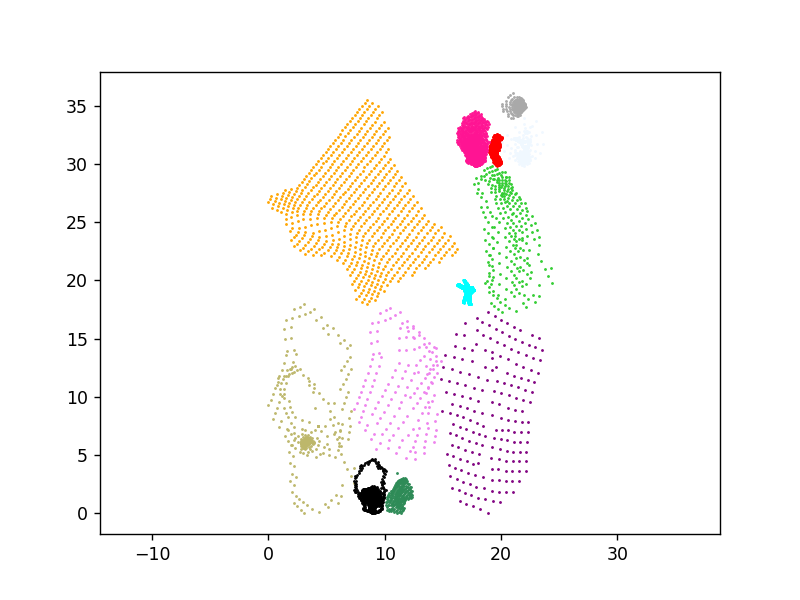

In [156]:
draw_all_charts(uv_charts,colors)

In [563]:
def corner_uv(chart):
    xx=[p.x for p in chart]
    yy=[p.y for p in chart]
    minx=min(xx)
    miny=min(yy)
    maxx=max(xx)
    maxy=max(yy)
    return minx,miny,maxx,maxy

In [564]:
def create_packing_uv(charts):
    lx=0
    ly=0
    rects=[]
    for chart in charts:
        minx,miny,maxx,maxy=corner_uv(chart)
        # print(maxx-minx)
        # print(maxy-miny)
        rects.append((maxx-minx,maxy-miny))
        lx+=maxx-minx
        ly+=maxy-miny
    
    lx/=2
    ly/=2
    return rects,[lx,ly]

In [565]:
rectangle,area=create_packing_uv(valid_charts)

In [566]:
solution_uv_rabbit=solve_packing(rectangle)

In [569]:
def adjust_coords_uv(charts,solution):
    for i in range(len(charts)):
        chart=charts[i]
        minx,miny,maxx,maxy=corner_uv(chart)
        info=solution.floorplan.positions[i]
        for p in chart:
            p.u+=(info["x"]-minx)
            p.v+=(info["y"]-miny)

In [570]:
adjust_coords_uv(valid_charts,solution_uv_rabbit)

In [571]:
def draw_final(charts,pointsize=1,draw_lines=True,text=False):
    fig = plt.figure()
    ax = plt.axes()
    for i in range(len(charts)):
        chart=charts[i]
        for p in chart:
            ax.scatter(point.u,point.v,s=pointsize,c='b')
            if draw_lines:
                for nei in point.neighbors:
                    ax.plot([point.u,nei.u],[point.v,nei.v],c='r')
            if text:
                ax.text(point.u,point.v,point.index)
    ax.axis("equal") 
    plt.show()
    

<IPython.core.display.Javascript object>


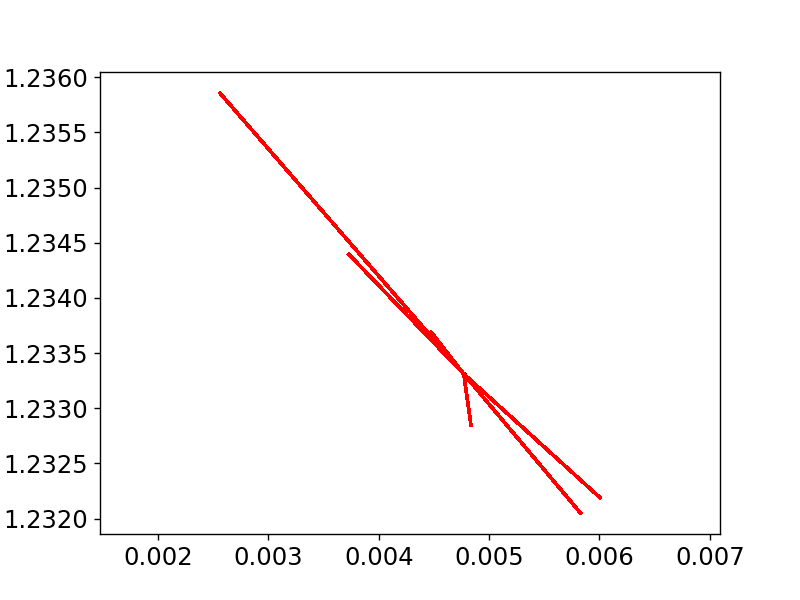

In [572]:
draw_final(valid_charts)